# Loading data

In [1]:
## Loading run-01
import nibabel as nib
import numpy as np

root_path = '/home/yvonne/ds003481-1.0.2/output/sub-123/func/'
file_name = 'sub-123_task-verbs_run-01_space-T1w_desc-preproc_bold.nii.gz'

img01 = nib.load(root_path + file_name)
data = img01.get_fdata()

Data shape: (39, 49, 39, 174)
(39, 49, 39, 174)


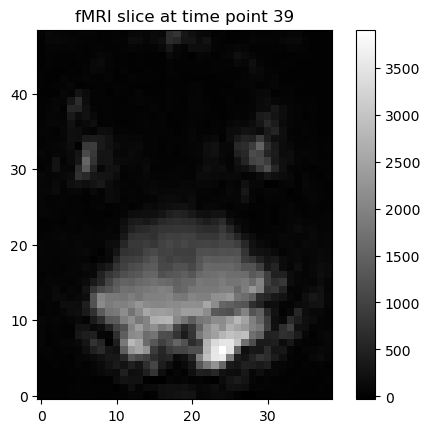

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:109: UserWarning: Threshold given was 1e-06, but the data has no values below -388.4184265136719. 
  warnings.warn(
/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



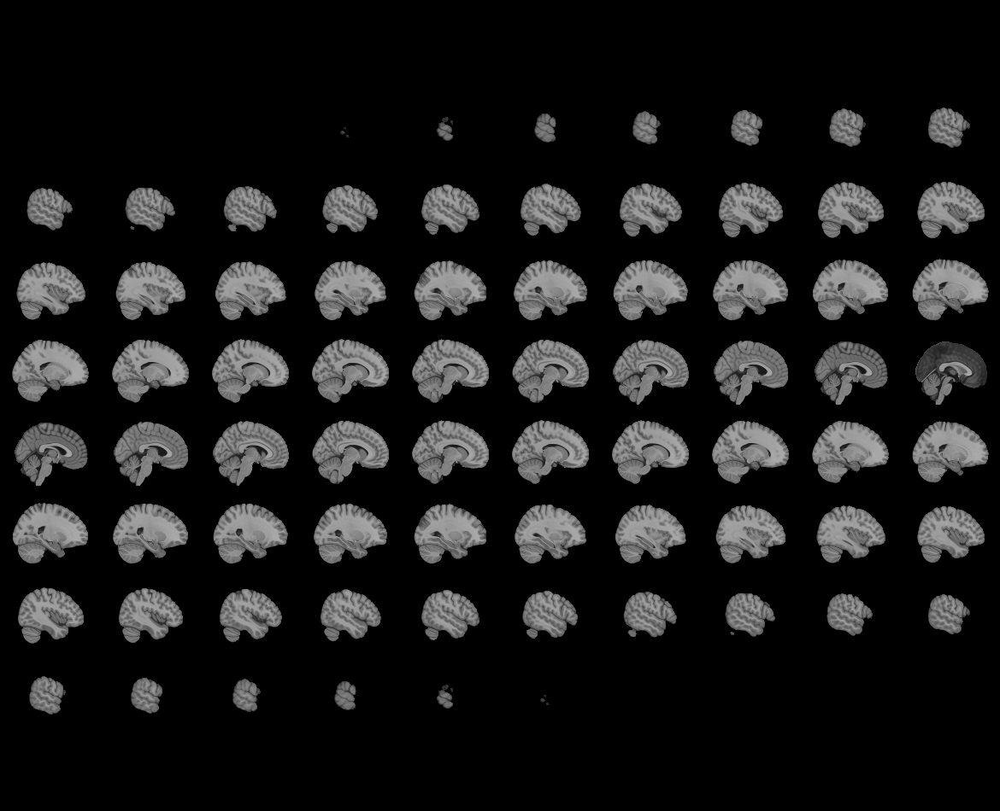
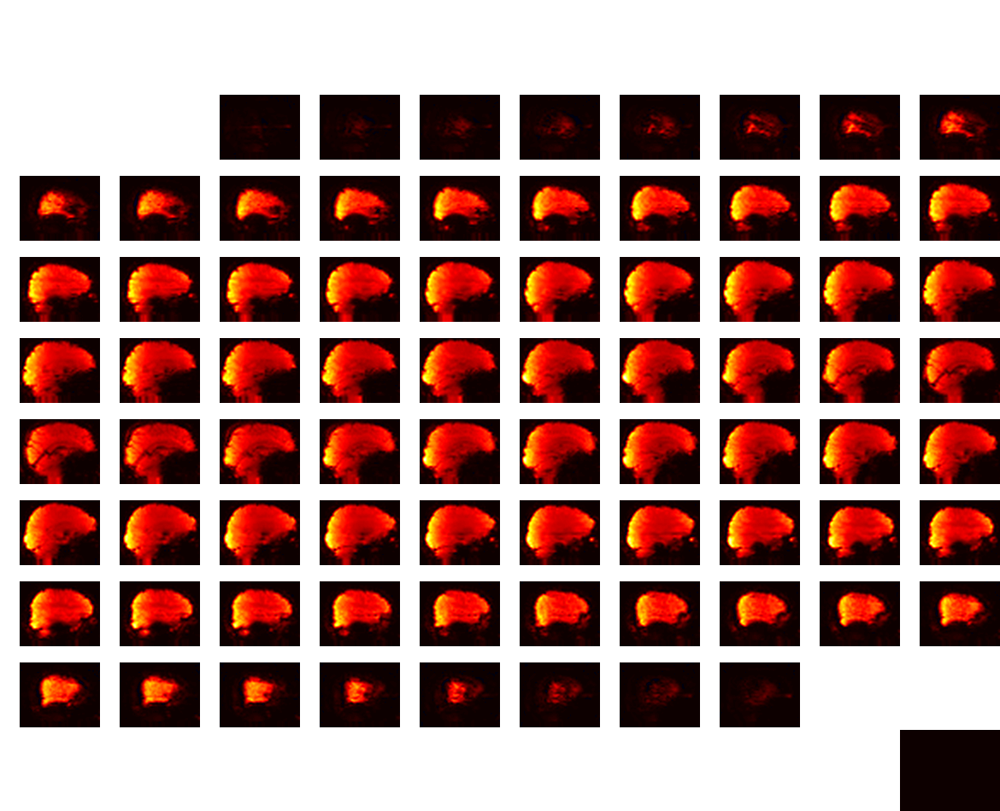

In [ ]:
import matplotlib.pyplot as plt

# Print shape
print("Data shape:", data.shape)

# Plot one slice from one time point
print(data.shape) # (39, 49, 39, 174)
t = 39
slice_data = data[:, :, 10, t]  
plt.imshow(slice_data.T, cmap='gray', origin='lower')
plt.title("fMRI slice at time point {}".format(t))
plt.colorbar()
plt.show()

# seems to be a bit off, probably needs a mask?
from nilearn import plotting
plotting.view_img(img01.slicer[:,:,:,t], title="fMRI data at time point {}".format(t))

In [3]:
import nibabel as nib
import os

# Example: list of NIfTI files
nii_paths = [
    f"/home/yvonne/ds003481-1.0.2/output/sub-123/func/sub-123_task-verbs_run-{i:02d}_space-T1w_desc-preproc_bold.nii.gz"
    for i in range(1, 9)
]

for path in nii_paths:
    img = nib.load(path)
    n_tr = img.shape[3]  # number of timepoints
    tr_duration = img.header.get_zooms()[3]  # TR in seconds
    run_duration = n_tr * tr_duration

    print(f"{os.path.basename(path)}: {n_tr} TRs × {tr_duration:.2f} sec = {run_duration:.2f} sec")


sub-123_task-verbs_run-01_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-02_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-03_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-04_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-05_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-06_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-07_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec
sub-123_task-verbs_run-08_space-T1w_desc-preproc_bold.nii.gz: 174 TRs × 2.00 sec = 348.00 sec


# GLM

In [3]:
%matplotlib inline

import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib
from nltools.file_reader import onsets_to_dm
from nltools.stats import regress, zscore
from nltools.data import Brain_Data, Design_Matrix
from nltools.stats import find_spikes 
from nilearn.plotting import view_img, glass_brain, plot_stat_map
from bids import BIDSLayout, BIDSValidator

In [4]:
import nibabel as nib

for i in range(1, 9):
    # Load one of the run files
    img = nib.load(f"/home/yvonne/ds003481-1.0.2/output/sub-123/func/sub-123_task-verbs_run-0{i}_space-T1w_desc-preproc_bold.nii.gz")

    # Shape of the image: (x, y, z, t)
    print("Image shape:", img.shape)

    # Number of TRs is the size of the 4th dimension (t)
    n_tr = img.shape[3]
    print("Number of TRs:", n_tr)

Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174
Image shape: (39, 49, 39, 174)
Number of TRs: 174


In [5]:
import pandas as pd

tr = 2.0              # seconds
n_tr_per_run = 174    # example: number of TRs per run
run_duration = tr * n_tr_per_run

base_path = "/home/yvonne/ds003481-1.0.2/sub-123/func"
all_events = []

for i in range(1, 9):
    run_str = f"{i:02d}"
    path = f"{base_path}/sub-123_task-verbs_run-{run_str}_events.tsv"
    
    df = pd.read_csv(path, sep='\t')
    df["trial_type"] = df["trial_type"].str.strip().str.lower() # to fix trial types with non standard format
    df["run"] = i
    df["onset"] += (i - 1) * run_duration  # <-- Shift onset for concatenated BOLD
    all_events.append(df)

combined_events = pd.concat(all_events, ignore_index=True)
combined_events.sort_values(by="onset", inplace=True)


In [6]:
def onsets_to_design_matrix(events, tr, n_tr):
    """
    Convert BIDS-style events to a one-hot design matrix
    """
    timepoints = np.arange(0, n_tr * tr, tr)
    design_matrix = pd.DataFrame(0, index=np.arange(n_tr), columns=events['trial_type'].unique())

    for _, row in events.iterrows():
        start = int(np.floor(row['onset'] / tr))
        end = int(np.ceil((row['onset'] + row['duration']) / tr))
        design_matrix.loc[start:end-1, row['trial_type']] = 1.0

    return Design_Matrix(design_matrix)

# === Load and process ===

# Parameters
bold_path = "/home/yvonne/ds003481-1.0.2/output/sub-123/func/sub-123_task-verbs_run-01_space-T1w_desc-preproc_bold.nii.gz"
img = nib.load(bold_path)
tr = 2.0  # Adjust to your actual TR
n_tr = img.shape[-1]

for i, run_df in enumerate(all_events):
    run_df = run_df.copy()  # avoid modifying original
    run_df["onset"] -= i * run_duration

    locals()[f"run{i+1:02d}"] = run_df
    
    dm = onsets_to_design_matrix(run_df, tr=tr, n_tr=n_tr)
    dm.sampling_freq = 1 / tr

    locals()[f"dm{i+1:02d}"] = dm

run01.describe()

,onset,duration,run
count,80.000000,80.0,80.0
mean,172.500000,1.0,1.0
std,97.228688,0.0,0.0
min,12.000000,1.0,1.0
25%,92.250000,1.0,1.0
50%,172.500000,1.0,1.0
75%,252.750000,1.0,1.0
max,333.000000,1.0,1.0


In [7]:
dm01.describe()

,mental,pseudo,motor,symbol
count,174.000000,174.000000,174.000000,174.000000
mean,0.114943,0.114943,0.114943,0.114943
std,0.319873,0.319873,0.319873,0.319873
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000


<Axes: xlabel='trial_type'>

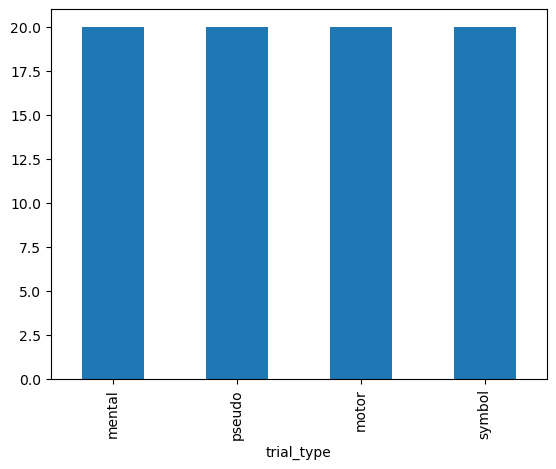

In [8]:
# count trial types
trial_type_counts = run01['trial_type'].value_counts()
trial_type_counts.plot(kind='bar')

In [9]:
dm01[-10:]

,mental,pseudo,motor,symbol
164,0,0,0,0
165,0,0,1,0
166,0,0,1,0
167,0,0,0,0
168,0,0,0,0
169,0,0,0,0
170,0,0,0,0
171,0,0,0,0
172,0,0,0,0
173,0,0,0,0


<Axes: title={'center': 'Design Matrix for Task Verbs'}>

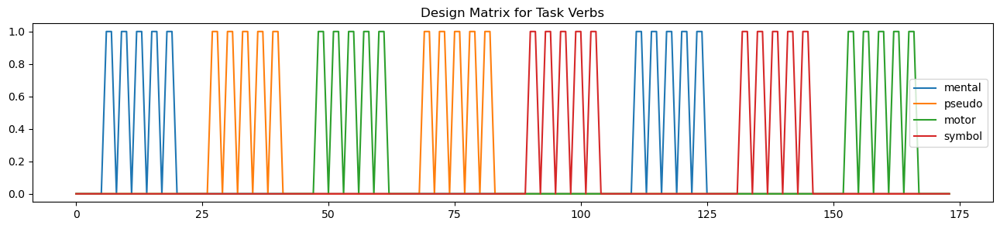

In [10]:
dm01.plot(figsize=(16, 3), title="Design Matrix for Task Verbs")

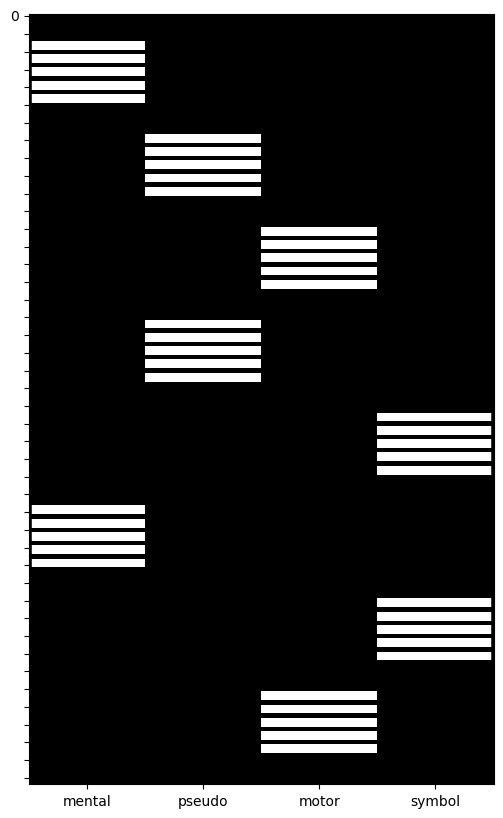

In [34]:
dm01.heatmap(figsize=(6, 10))

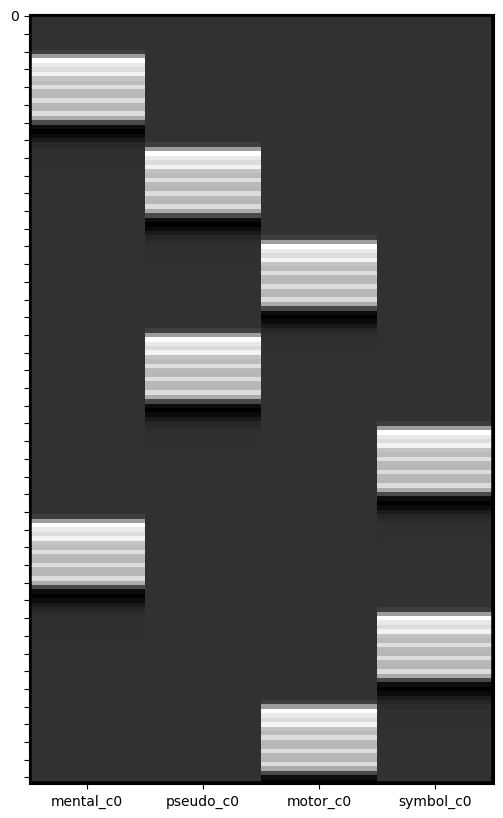

In [35]:
dm01_conv = dm01.convolve()
dm01_conv.heatmap(figsize=(6, 10))

<Axes: >

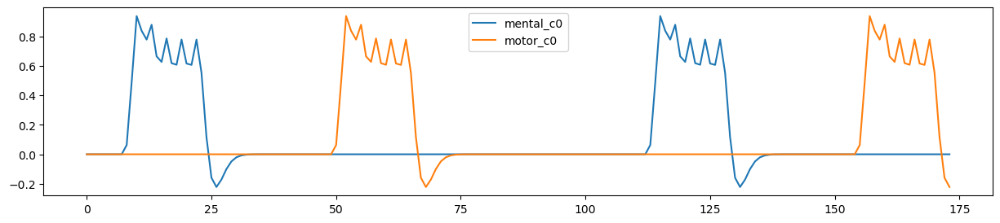

In [13]:
f,a = plt.subplots(figsize=(15,3))
dm01_conv[['mental_c0','motor_c0']].plot(ax=a)

## Colinearity

<Axes: >

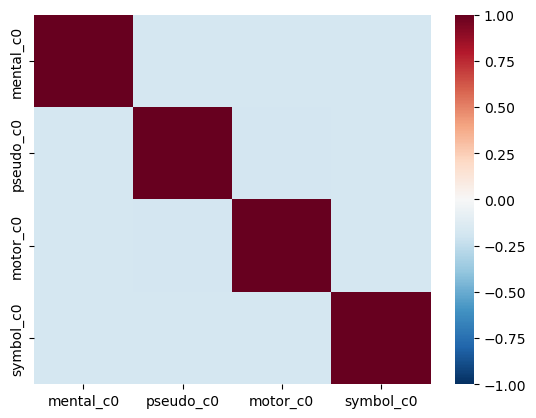

In [15]:
sns.heatmap(dm01_conv.corr(), vmin=-1, vmax=1, cmap='RdBu_r')

## Filtering
Bad idea to filter it all at once

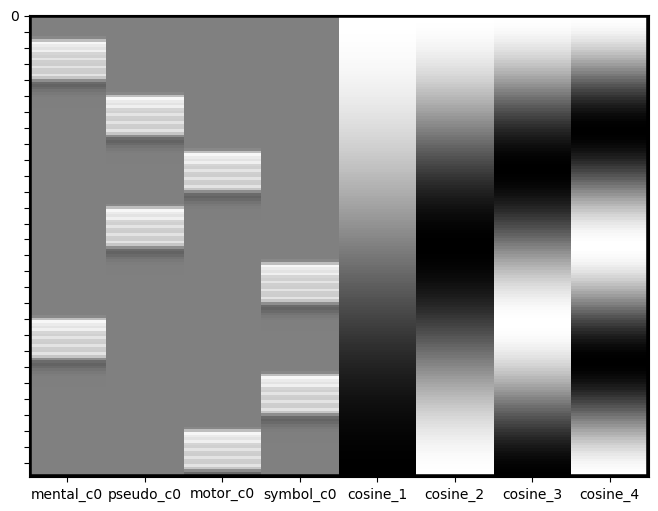

In [16]:
dm01_conv_filt = dm01_conv.add_dct_basis(duration=174)
dm01_conv_filt.heatmap()

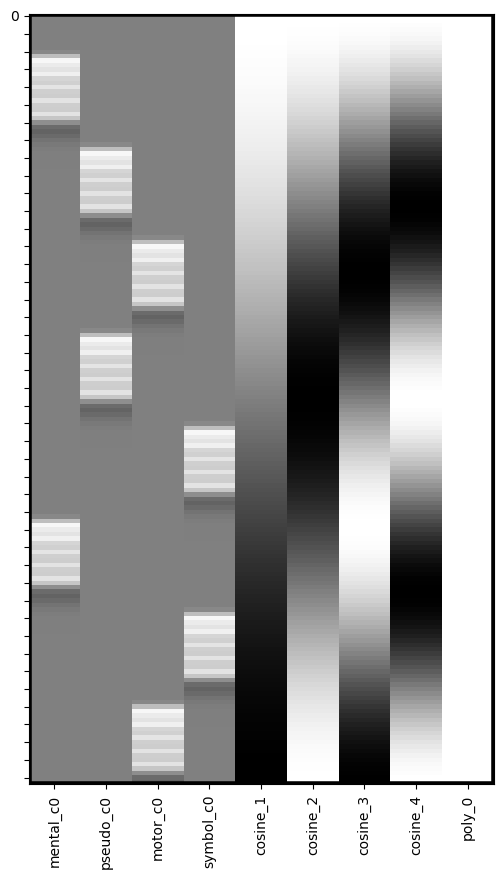

In [36]:
# adding the intercept term
dm01_conv_filt_poly = dm01_conv_filt.add_poly()
dm01_conv_filt_poly.heatmap(figsize=(6, 10))

# Noise covairates

In [18]:
# sub-123, run-01
data = Brain_Data('ds003481-1.0.2/output/sub-123/func/sub-123_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/maskers/nifti_masker.py:114: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(


[NiftiMasker.wrapped] Resampling images


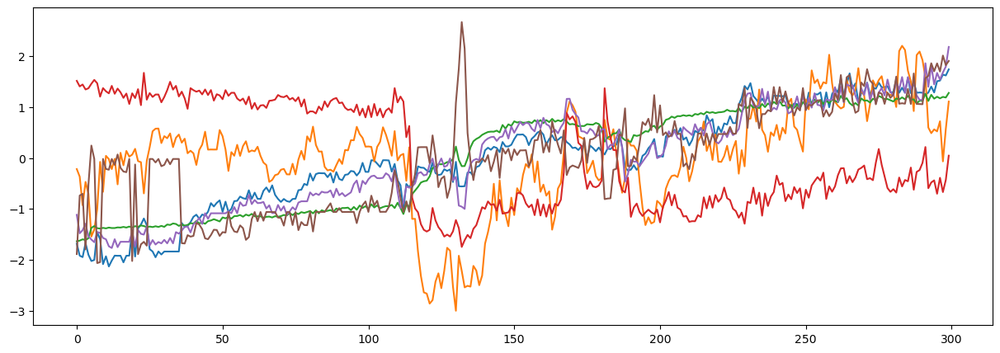

In [19]:
covariates = pd.read_csv('ds003481-1.0.2/output/sub-123/func/sub-123_task-rest_desc-confounds_timeseries.tsv', sep='\t')

mc = covariates[['trans_x','trans_y','trans_z','rot_x', 'rot_y', 'rot_z']]

plt.figure(figsize=(15,5))
plt.plot(zscore(mc))

In [21]:
type(mc)

pandas.core.frame.DataFrame

<Axes: >

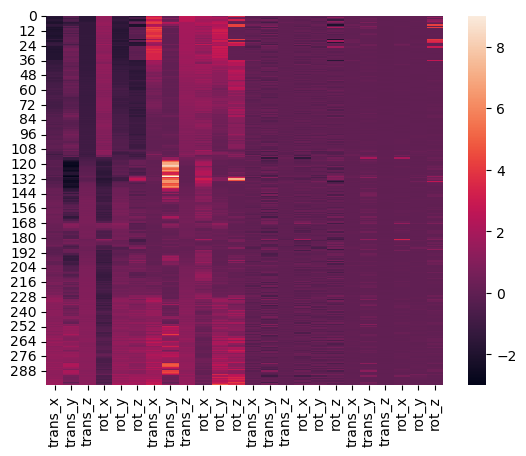

In [20]:
def make_motion_covariates(mc, tr):
    z_mc = zscore(mc)
    all_mc = pd.concat([z_mc, z_mc**2, z_mc.diff(), z_mc.diff()**2], axis=1)
    all_mc.fillna(value=0, inplace=True)
    return Design_Matrix(all_mc, sampling_freq=1/tr)

mc_cov = make_motion_covariates(mc, tr)

sns.heatmap(mc_cov)

Text(0, 0.5, 'Intensity')

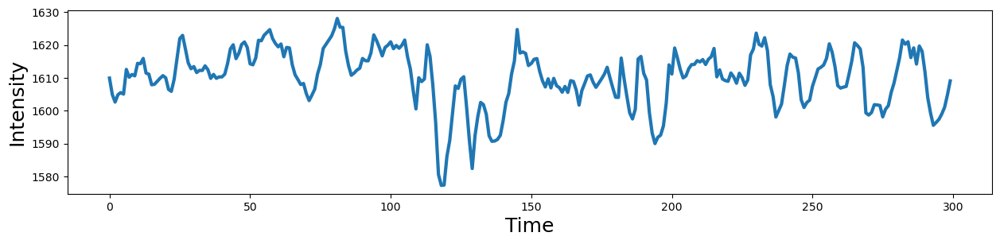

In [22]:
plt.figure(figsize=(15,3))
plt.plot(np.mean(data.data, axis=1), linewidth=3)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Intensity', fontsize=18)

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nltools/stats.py:1761: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  outlier["global_spike" + str(i + 1)].iloc[int(loc)] = 1
/home/yvonne/miniconda3/envs/brainhack/lib/pytho

<Axes: >

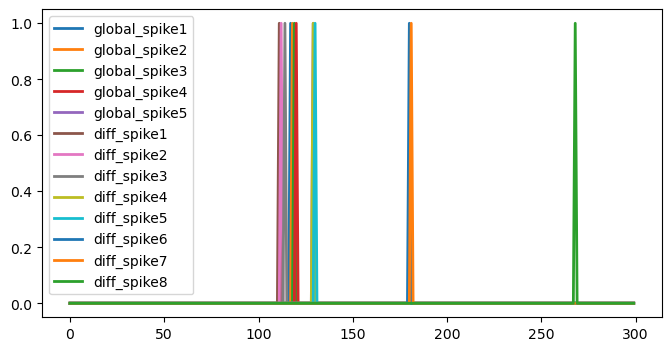

In [37]:
spikes = data.find_spikes(global_spike_cutoff=2.5, diff_spike_cutoff=2.5)

f, a = plt.subplots(figsize=(8, 4))
spikes = Design_Matrix(spikes.iloc[:,1:], sampling_freq=1/tr)
spikes.plot(ax = a, linewidth=2)

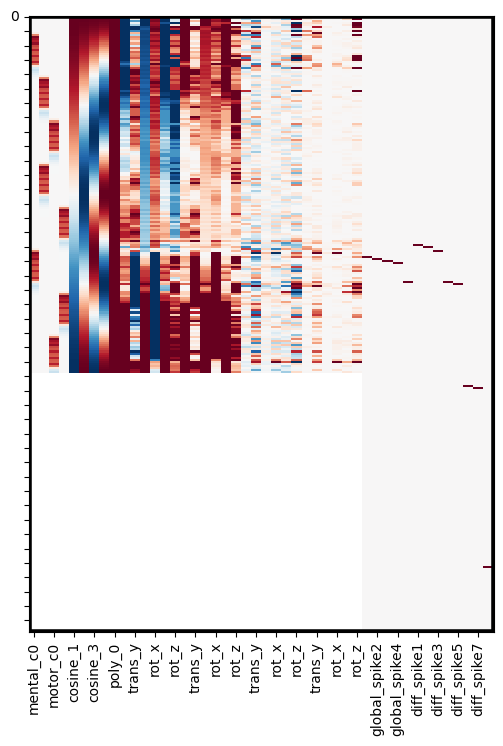

In [38]:
dm01_conv_filt_poly_cov = pd.concat([dm01_conv_filt_poly, mc_cov, spikes], axis=1)
dm01_conv_filt_poly_cov.heatmap(cmap='RdBu_r', vmin=-1,vmax=1, figsize=(6, 8))

In [25]:
print(dm01_conv_filt_poly.shape)
print(mc_cov.shape)
print(spikes.shape)
print(n_tr)

(174, 9)
(300, 24)
(300, 13)
174


In [26]:
import nibabel as nib

img = nib.load('ds003481-1.0.2/output/sub-123/func/sub-123_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')
tr = img.header.get_zooms()[3]  # e.g., 2.0 seconds
run01 = pd.read_csv('ds003481-1.0.2/sub-123/func/sub-123_task-verbs_run-01_events.tsv', sep='\t')
run01['onset'].apply(lambda x: round(x % tr, 5)).value_counts()

onset
0.0    40
1.0    40
Name: count, dtype: int64

In [27]:
print("N TRs in image:", img.shape[-1])
print("N rows in mc_cov:", mc_cov.shape[0])

N TRs in image: 300
N rows in mc_cov: 300


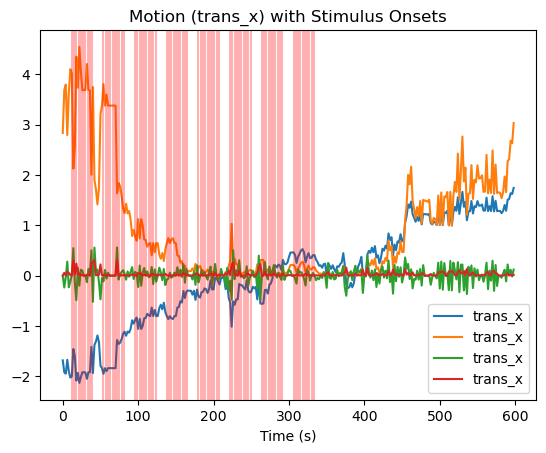

In [28]:
import matplotlib.pyplot as plt

time_axis = np.arange(mc_cov.shape[0]) * tr
plt.plot(time_axis, mc_cov['trans_x'], label='trans_x')

for onset in run01['onset']:
    plt.axvline(onset, color='r', alpha=0.3)

plt.xlabel('Time (s)')
plt.legend()
plt.title('Motion (trans_x) with Stimulus Onsets')
plt.show()


Reflection:

- Time alignment could be problematic here. Better re-check onset time. 
- Probably requires re-analyzing after trimming. 

## Requires trimming
The fmri scan file contains 300 TRs, but the stimuli only lasts for 174. 

In [29]:
import nibabel as nib
import numpy as np

# Load image
bold = Brain_Data('ds003481-1.0.2/output/sub-123/func/sub-123_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')
bold_trimmed = bold[:174] 
# bold_trimmed.write('sub-123_run01_trimmed.nii.gz')

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/maskers/nifti_masker.py:114: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(


[NiftiMasker.wrapped] Resampling images


In [40]:
import pandas as pd

confounds = pd.read_csv('ds003481-1.0.2/output/sub-123/func/sub-123_task-rest_desc-confounds_timeseries.tsv', sep='\t')
confounds_trimmed = confounds.iloc[:174]
# confounds_trimmed.to_csv('confounds_trimmed.tsv', sep='\t', index=False)

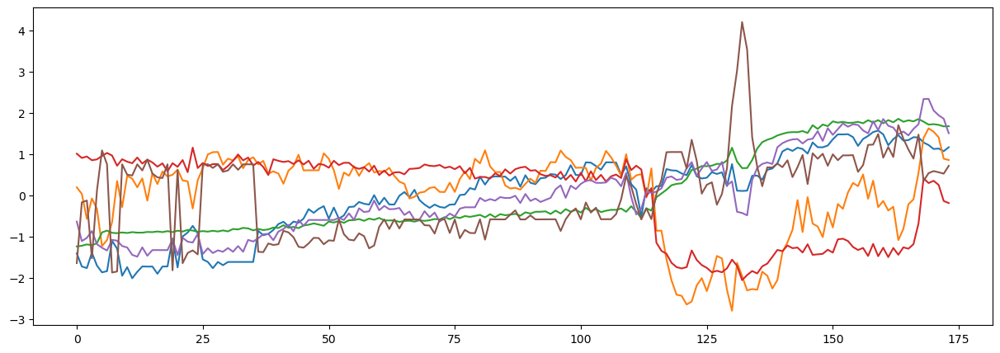

In [41]:
mc = confounds_trimmed[['trans_x','trans_y','trans_z','rot_x', 'rot_y', 'rot_z']]

plt.figure(figsize=(15,5))
plt.plot(zscore(mc))

<Axes: >

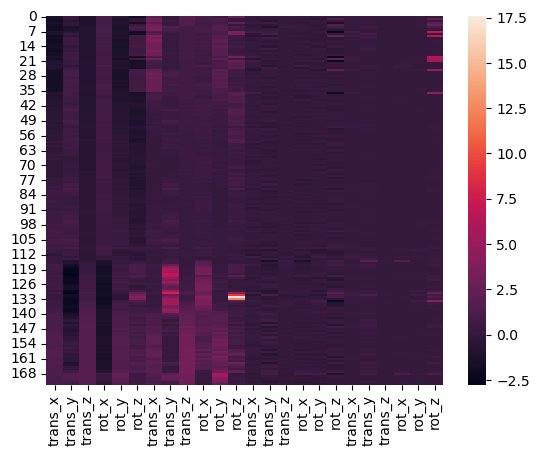

In [42]:
def make_motion_covariates(mc, tr):
    z_mc = zscore(mc)
    all_mc = pd.concat([z_mc, z_mc**2, z_mc.diff(), z_mc.diff()**2], axis=1)
    all_mc.fillna(value=0, inplace=True)
    return Design_Matrix(all_mc, sampling_freq=1/tr)

mc_cov = make_motion_covariates(mc, tr)

sns.heatmap(mc_cov)

Text(0, 0.5, 'Intensity')

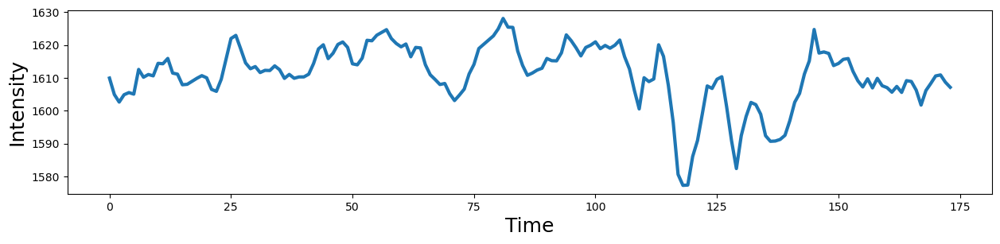

In [43]:
plt.figure(figsize=(15,3))
plt.plot(np.mean(bold_trimmed.data, axis=1), linewidth=3)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Intensity', fontsize=18)

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nltools/stats.py:1761: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  outlier["global_spike" + str(i + 1)].iloc[int(loc)] = 1
/home/yvonne/miniconda3/envs/brainhack/lib/pytho

<Axes: >

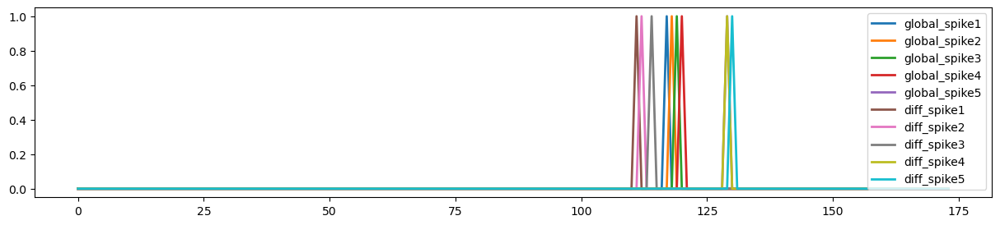

In [44]:
spikes = bold_trimmed.find_spikes(global_spike_cutoff=2.5, diff_spike_cutoff=2.5)

f, a = plt.subplots(figsize=(15,3))
spikes = Design_Matrix(spikes.iloc[:,1:], sampling_freq=1/tr)
spikes.plot(ax = a, linewidth=2)

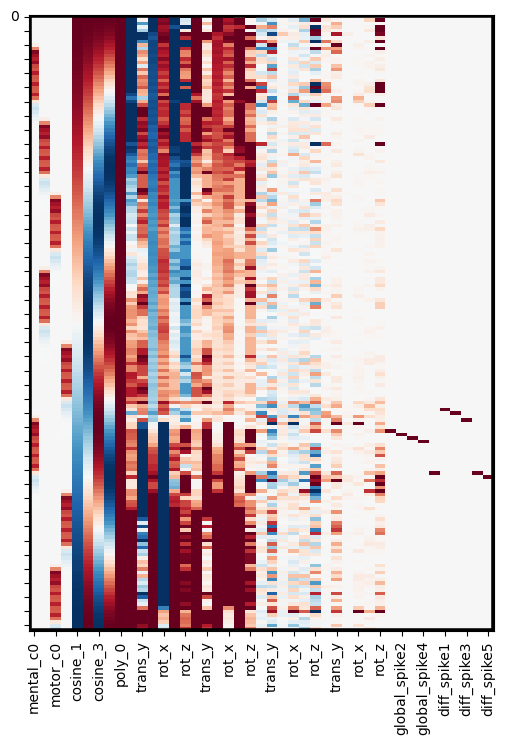

In [45]:
dm01_conv_filt_poly_cov = pd.concat([dm01_conv_filt_poly, mc_cov, spikes], axis=1)
dm01_conv_filt_poly_cov.heatmap(cmap='RdBu_r', vmin=-1,vmax=1, figsize=(6, 8))

# Smoothing

Followed instructions from DartBrain, but should the order change?

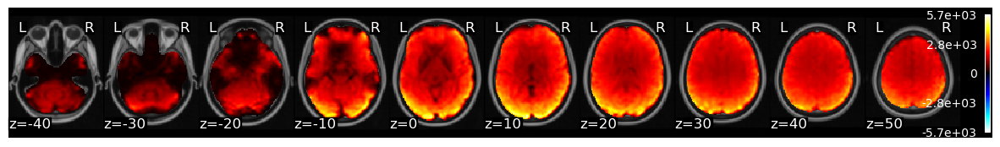

In [52]:
fwhm=6
smoothed = bold_trimmed.smooth(fwhm=fwhm)
bold_trimmed.mean().plot(colorbar=True)

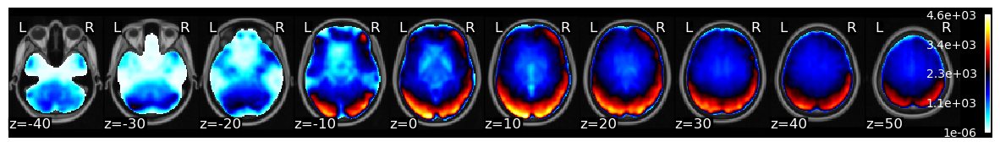

In [53]:
smoothed.mean().plot(colorbar=True)

# Estimate GLM for all voxels

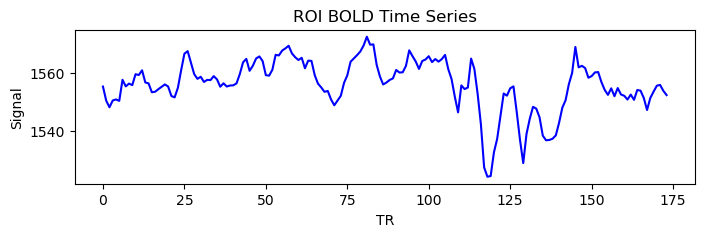

In [64]:
import numpy as np
import matplotlib.pyplot as plt

# 1. extract your ROI time series
arr     = smoothed.data           # (n_volumes, n_voxels)
ts      = np.mean(arr, axis=1)    # (n_volumes,)

# 2. plot
plt.figure(figsize=(8,2))
plt.plot(ts, color='blue')
plt.xlabel('TR')
plt.ylabel('Signal')
plt.title('ROI BOLD Time Series')
plt.show()


In [54]:
smoothed.X = dm01_conv_filt_poly_cov
stats = smoothed.regress()

print(stats.keys())

dict_keys(['beta', 't', 'p', 'df', 'sigma', 'residual'])


In [55]:
print(smoothed.X.columns)

Index(['mental_c0', 'pseudo_c0', 'motor_c0', 'symbol_c0', 'cosine_1',
       'cosine_2', 'cosine_3', 'cosine_4', 'poly_0', 'trans_x', 'trans_y',
       'trans_z', 'rot_x', 'rot_y', 'rot_z', 'trans_x', 'trans_y', 'trans_z',
       'rot_x', 'rot_y', 'rot_z', 'trans_x', 'trans_y', 'trans_z', 'rot_x',
       'rot_y', 'rot_z', 'trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y',
       'rot_z', 'global_spike1', 'global_spike2', 'global_spike3',
       'global_spike4', 'global_spike5', 'diff_spike1', 'diff_spike2',
       'diff_spike3', 'diff_spike4', 'diff_spike5'],
      dtype='object')


In [39]:
# smoothed.write(f'sub-123_run-01_betas_denoised_smoothed{fwhm}_preprocessed_fMRI_bold.nii.gz')

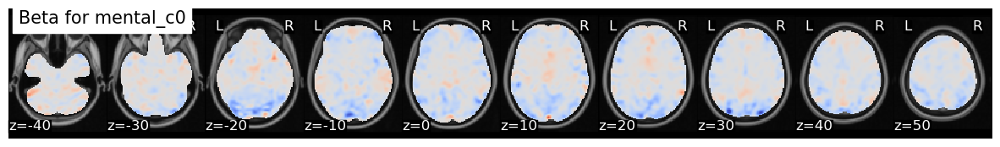

In [56]:
stats['beta'][0].plot(title='Beta for mental_c0', cmap='coolwarm', vmin=-100, vmax=100)

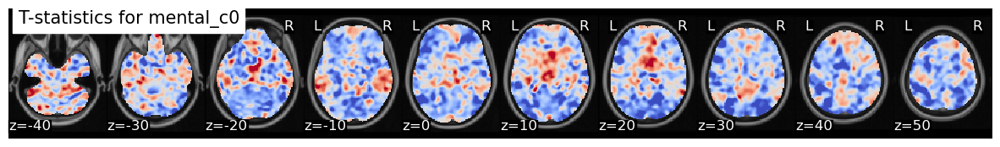

In [57]:
stats['t'][0].plot(title='T-statistics for mental_c0', cmap='coolwarm', vmin=-3, vmax=3)

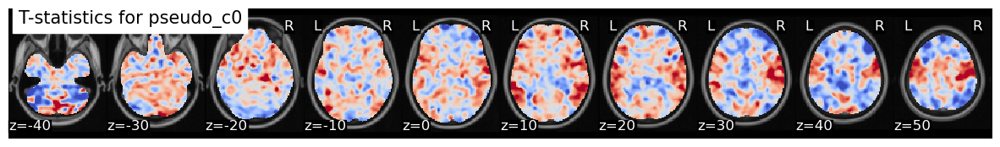

In [65]:
stats['t'][1].plot(title='T-statistics for pseudo_c0', cmap='coolwarm', vmin=-3, vmax=3)

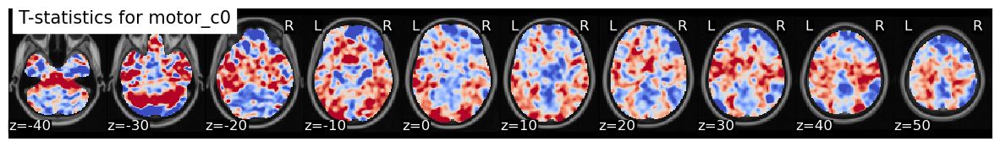

In [66]:
stats['t'][2].plot(title='T-statistics for motor_c0', cmap='coolwarm', vmin=-3, vmax=3)

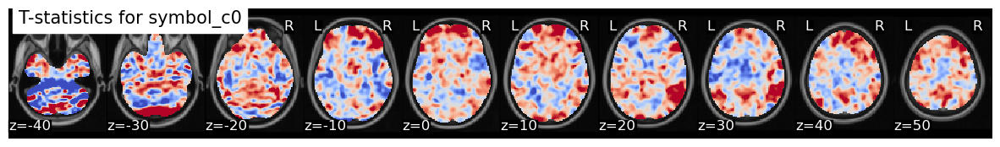

In [67]:
stats['t'][3].plot(title='T-statistics for symbol_c0', cmap='coolwarm', vmin=-3, vmax=3)

In [64]:
stats

{'beta': nltools.data.brain_data.Brain_Data(data=(43, 238955), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz),
 't': nltools.data.brain_data.Brain_Data(data=(43, 238955), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz),
 'p': nltools.data.brain_data.Brain_Data(data=(43, 238955), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz),
 'df': nltools.data.brain_data.Brain_Data(data=(238955,), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz),
 'sigma': nltools.data.brain_data.Brain_Data(data=(43, 238955), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz),
 'residual': nltools.data.brain_data.Brain_Data(data=(174, 238955), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)}

# Contrasts

Index(['mental_c0', 'pseudo_c0', 'motor_c0', 'symbol_c0', 'cosine_1',
       'cosine_2', 'cosine_3', 'cosine_4', 'poly_0', 'trans_x', 'trans_y',
       'trans_z', 'rot_x', 'rot_y', 'rot_z', 'trans_x', 'trans_y', 'trans_z',
       'rot_x', 'rot_y', 'rot_z', 'trans_x', 'trans_y', 'trans_z', 'rot_x',
       'rot_y', 'rot_z', 'trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y',
       'rot_z', 'global_spike1', 'global_spike2', 'global_spike3',
       'global_spike4', 'global_spike5', 'diff_spike1', 'diff_spike2',
       'diff_spike3', 'diff_spike4', 'diff_spike5'],
      dtype='object')
[-1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.]


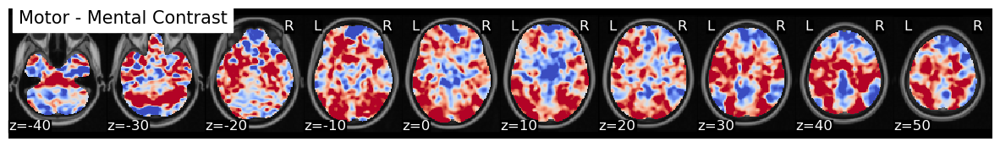

In [81]:
# motor - mental contrasts
print(smoothed.X.columns)

c1 = np.zeros(len(stats['t']))
c1[2] = 1 # motor_c0 = 1
c1[0] = -1 # mental_c0 = -1
print(c1)

mot_men = stats['t'] * c1

mot_men.plot(title='Motor - Mental Contrast', cmap='coolwarm', vmin=-3, vmax=3)

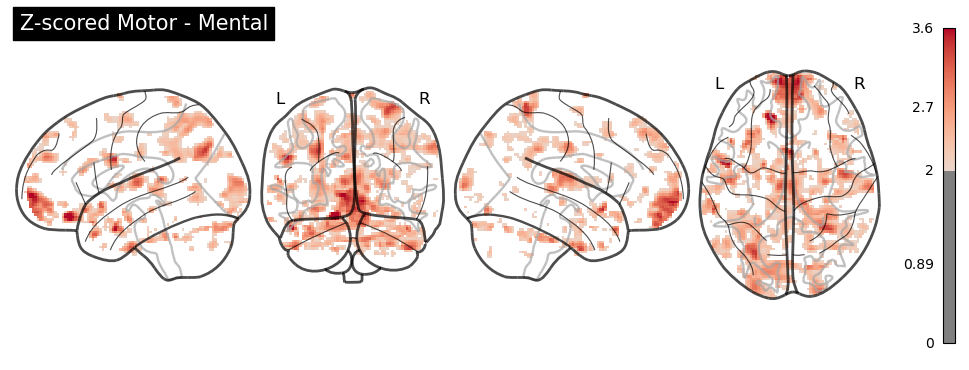

In [82]:
from scipy.stats import zscore
mot_men.data = zscore(mot_men.data, axis=0)

# Plot
plotting.plot_glass_brain(mot_men.to_nifti(), title='Z-scored Motor - Mental', display_mode='lyrz',
                 cmap='coolwarm', threshold=1.96, colorbar=True)

[ 1.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.]


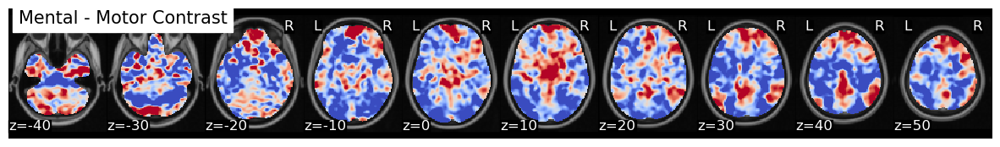

In [83]:
# mental - motor contrasts
c2 = np.zeros(len(stats['t']))
c2[0] = 1 # mental_c0 = 1
c2[2] = -1 # motor_c0 = -1
print(c2)

men_mot = stats['t'] * c2

men_mot.plot(title='Mental - Motor Contrast', cmap='coolwarm', vmin=-3, vmax=3)

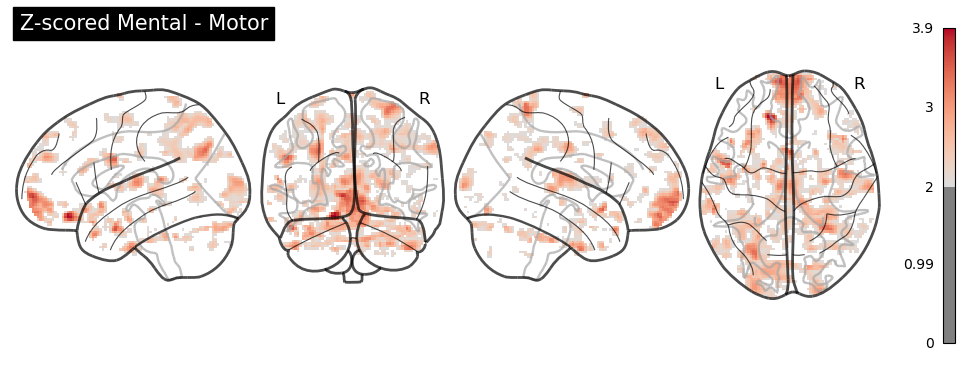

In [84]:
from scipy.stats import zscore
men_mot.data = zscore(men_mot.data, axis=0)

# Plot
plotting.plot_glass_brain(men_mot.to_nifti(), title='Z-scored Mental - Motor', display_mode='lyrz',
                 cmap='coolwarm', threshold=1.96, colorbar=True)

[ 0.5 -0.5  0.5 -0.5  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0. ]


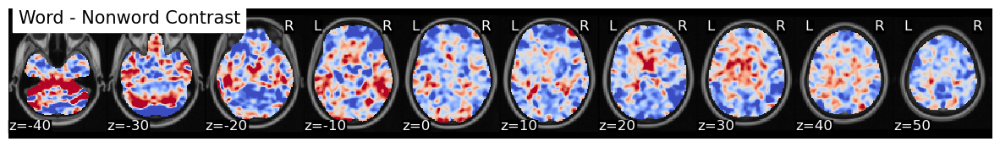

In [85]:
# actual words - pseudo words
c3 = np.zeros(len(stats['t']))
c3[[0, 2]] = 0.5     # mental + motor
c3[[1, 3]] = -0.5    # pseudo + symbol
print(c3)

word_nonw = stats['t'] * c3

word_nonw.plot(title='Word - Nonword Contrast', cmap='coolwarm', vmin=-3, vmax=3)

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/plotting/img_plotting.py:1577: UserWarning: vmin is negative but plot_abs is True
  warnings.warn(


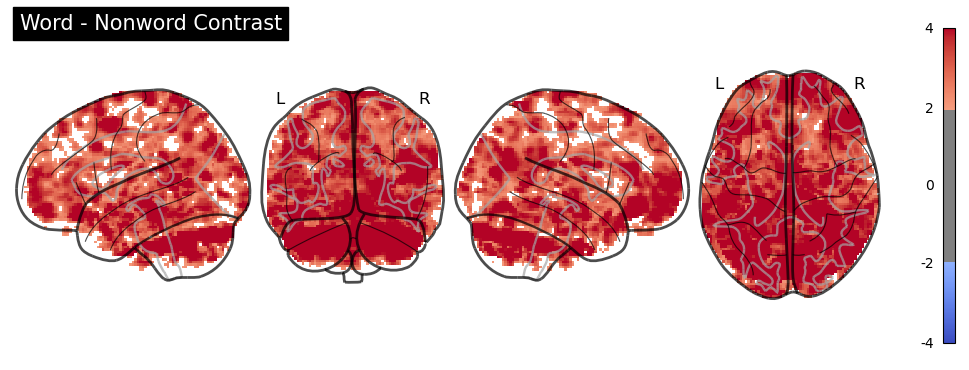

In [87]:
# Multiply beta weights
# word_nonw = stats['beta'].dot(c3)
word_nonw = stats['t'] * c3

# Convert to NIfTI and plot as glass brain
nii_img = word_nonw.to_nifti()

plotting.plot_glass_brain(nii_img, title='Word - Nonword Contrast', display_mode='lyrz',
                 cmap='coolwarm', colorbar=True, threshold=1.96, vmax=4, vmin=-4)

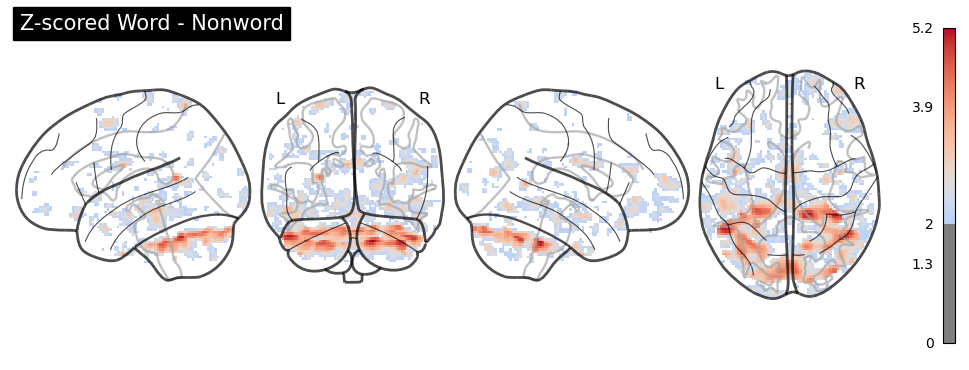

In [88]:
# Optionally standardize contrast values
from scipy.stats import zscore
word_nonw.data = zscore(word_nonw.data, axis=0)

# Plot
plotting.plot_glass_brain(word_nonw.to_nifti(), title='Z-scored Word - Nonword', display_mode='lyrz',
                 cmap='coolwarm', threshold=1.96, colorbar=True)


[ 0.33333333  0.33333333  0.33333333 -1.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.        ]


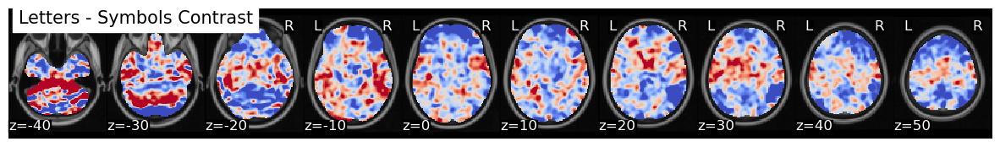

In [75]:
# letters - symbols
c4 = np.zeros(len(stats['t']))
c4[[0, 1, 2]] = 1/3     # mental + pseudo + motor
c4[3] = -1    # symbol
print(c4)

let_sym = stats['t'] * c4

let_sym.plot(title='Letters - Symbols Contrast', cmap='coolwarm', vmin=-3, vmax=3)

In [48]:
from nilearn.image import threshold_img
from nilearn.reporting import get_clusters_table

# 1. Get your NIfTI z-map
zmap = word_nonw.to_nifti()

# 2. Threshold (e.g. |z|>1.96 for p<.05 uncorrected) and drop tiny clusters
stat_thresh = 1.96
min_cluster_size = 20   # in voxels
# threshold at |z|>1.96 and drop clusters smaller than 20 voxels
thr_img = threshold_img(
    word_nonw.to_nifti(),
    threshold=1.96,
    mask_img=None,
    cluster_threshold=2,   # <-- use this, not min_region_size
    two_sided=True
)

# 3. Build a clusters table
table = get_clusters_table(zmap,
                           stat_threshold=stat_thresh,
                           cluster_threshold=min_cluster_size,
                           two_sided=True)

print(table)

/tmp/ipykernel_762324/1245769043.py:11: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  thr_img = threshold_img(


    Cluster ID     X     Y     Z  Peak Stat Cluster Size (mm3)
0            1  16.0 -40.0 -40.0   5.173547              27024
1           1a -50.0 -52.0 -36.0   5.051768                   
2           1b  38.0 -40.0 -42.0   5.002322                   
3           1c  50.0 -56.0 -38.0   4.822326                   
4            2 -26.0 -48.0  12.0   4.371345               1184
..         ...   ...   ...   ...        ...                ...
116         36  14.0  50.0 -18.0  -2.382351                168
117         37  30.0  52.0  -4.0  -2.370243                264
118         38 -42.0 -78.0  42.0  -2.281609                192
119         39   6.0  66.0  -6.0  -2.258526                312
120         40  30.0 -66.0 -48.0  -2.234005                192

[121 rows x 6 columns]


In [97]:
pd.DataFrame(table).to_csv('active_coordinates.csv')

### Feedback: 
* The activation pattern is strange, especially for the word vs. nonword contrast, lacking the activation of Visual Form Area. The brain map fitting seems to be lower than conventional. 

# Functional connectivity
* Representational Similarity Analysis
* Seed-based connectivity

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/maskers/nifti_masker.py:114: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(
/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/image/resampling.py:297: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(


[NiftiMasker.wrapped] Resampling images


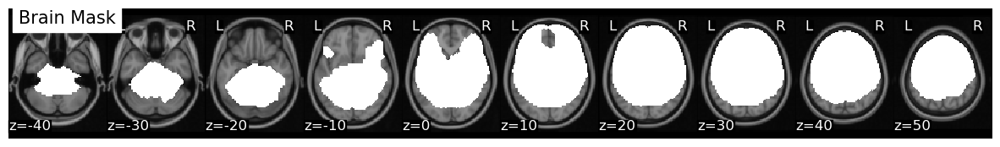

In [48]:
mask = Brain_Data('/home/yvonne/ds003481-1.0.2/output/sub-123/func/sub-123_task-verbs_run-01_space-T1w_desc-brain_mask.nii.gz')
mask.plot(title='Brain Mask', cmap='gray', vmin=0, vmax=1)

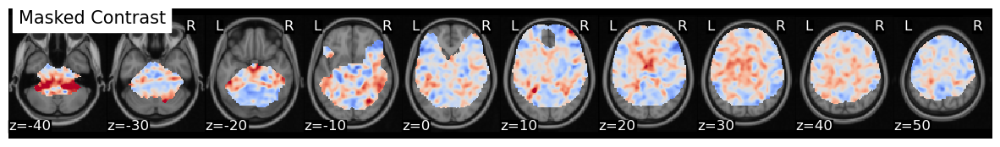

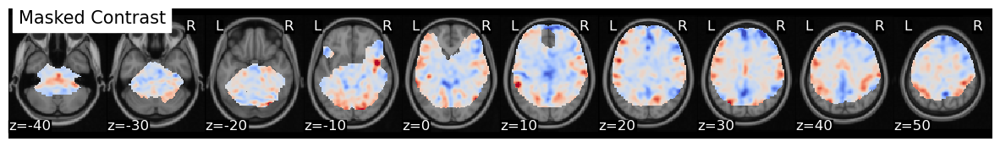

In [49]:
from nltools.data import Brain_Data
overlay = word_nonw.copy()
overlay.data[~mask.data.astype(bool)] = 0
overlay.plot(title='Masked Contrast', cmap='coolwarm', vmin=-3, vmax=3)

overlay = mot_men.copy()
overlay.data[~mask.data.astype(bool)] = 0
overlay.plot(title='Masked Contrast', cmap='coolwarm', vmin=-3, vmax=3)


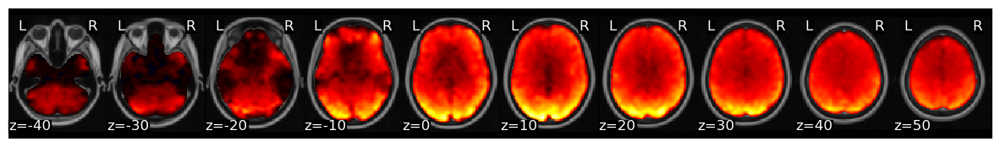

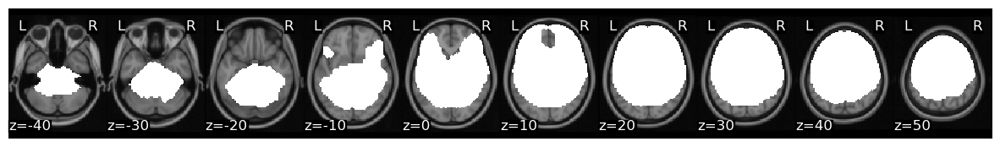

In [50]:
# Compare mask with mean EPI
from nltools.data import Brain_Data

mean_epi = stats['beta'].mean()
mean_epi.plot()
mask.plot()


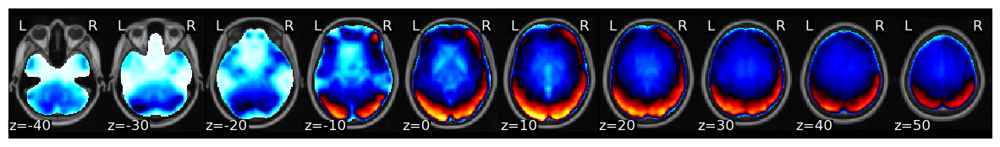

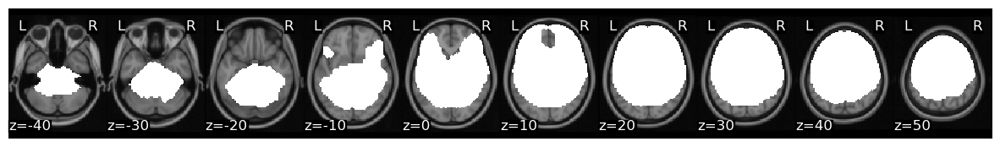

In [51]:
# Visual check
smoothed.mean().plot()
mask.plot()

🔍 Interpretation
Your input mask is not a labeled parcellation, but rather a binary mask.

That is:

It contains only 1s and 0s, where:

1 means "brain"

0 means "not brain"

There are no labeled regions (e.g., 1 = vmPFC, 2 = dlPFC, ...)

As a result, expand_mask() sees just one connected region (or a single non-zero label), so it returns a single mask.


## The Harvard-Oxford Atlas

[get_dataset_dir] Dataset found in /home/yvonne/nilearn_data/fsl
[NiftiMasker.wrapped] Resampling images


/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/maskers/nifti_masker.py:114: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(


Number of ROIs: 96


/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/masking.py:979: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(mask_img, unmasked, affine)


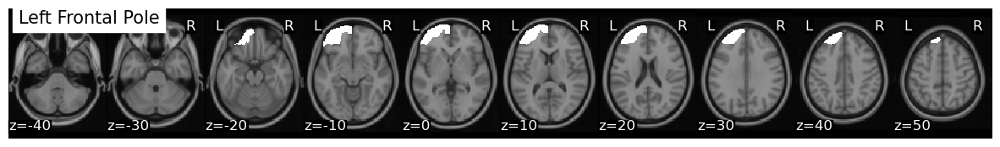

In [90]:
from nilearn.datasets import fetch_atlas_harvard_oxford
from nltools.data import Brain_Data
from nltools.mask import expand_mask

# Load the atlas
atlas = fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm', symmetric_split=True)
roi_mask = Brain_Data(atlas.maps)

# Expand into binary ROI masks
roi_masks = expand_mask(roi_mask)

# Check number of ROIs
print(f"Number of ROIs: {len(roi_masks)}")
roi_masks[0].plot(title=atlas.labels[1])  # index 0 usually corresponds to label 1

In [91]:
atlas.labels

['Background',
 'Left Frontal Pole',
 'Right Frontal Pole',
 'Left Insular Cortex',
 'Right Insular Cortex',
 'Left Superior Frontal Gyrus',
 'Right Superior Frontal Gyrus',
 'Left Middle Frontal Gyrus',
 'Right Middle Frontal Gyrus',
 'Left Inferior Frontal Gyrus, pars triangularis',
 'Right Inferior Frontal Gyrus, pars triangularis',
 'Left Inferior Frontal Gyrus, pars opercularis',
 'Right Inferior Frontal Gyrus, pars opercularis',
 'Left Precentral Gyrus',
 'Right Precentral Gyrus',
 'Left Temporal Pole',
 'Right Temporal Pole',
 'Left Superior Temporal Gyrus, anterior division',
 'Right Superior Temporal Gyrus, anterior division',
 'Left Superior Temporal Gyrus, posterior division',
 'Right Superior Temporal Gyrus, posterior division',
 'Left Middle Temporal Gyrus, anterior division',
 'Right Middle Temporal Gyrus, anterior division',
 'Left Middle Temporal Gyrus, posterior division',
 'Right Middle Temporal Gyrus, posterior division',
 'Left Middle Temporal Gyrus, temporooccipita

In [92]:
for i in range(len(roi_masks)):
    print(f"ROI {i+1}: {atlas.labels[i+1]}")  # i+1 because first label is background

ROI 1: Left Frontal Pole
ROI 2: Right Frontal Pole
ROI 3: Left Insular Cortex
ROI 4: Right Insular Cortex
ROI 5: Left Superior Frontal Gyrus
ROI 6: Right Superior Frontal Gyrus
ROI 7: Left Middle Frontal Gyrus
ROI 8: Right Middle Frontal Gyrus
ROI 9: Left Inferior Frontal Gyrus, pars triangularis
ROI 10: Right Inferior Frontal Gyrus, pars triangularis
ROI 11: Left Inferior Frontal Gyrus, pars opercularis
ROI 12: Right Inferior Frontal Gyrus, pars opercularis
ROI 13: Left Precentral Gyrus
ROI 14: Right Precentral Gyrus
ROI 15: Left Temporal Pole
ROI 16: Right Temporal Pole
ROI 17: Left Superior Temporal Gyrus, anterior division
ROI 18: Right Superior Temporal Gyrus, anterior division
ROI 19: Left Superior Temporal Gyrus, posterior division
ROI 20: Right Superior Temporal Gyrus, posterior division
ROI 21: Left Middle Temporal Gyrus, anterior division
ROI 22: Right Middle Temporal Gyrus, anterior division
ROI 23: Left Middle Temporal Gyrus, posterior division
ROI 24: Right Middle Temporal

In [52]:
from nltools.data import Brain_Data

# 1) Convert your thresholded map into Brain_Data
sig_bd = Brain_Data(thr_img)        
sig_vec = sig_bd.data[0] > 0      # boolean mask of significant voxels

roi_hits = {}
for idx, roi in enumerate(roi_masks):
    roi_vec = roi.data[0] > 0     # boolean mask of ROI voxels
    n = (sig_vec & roi_vec).sum() # count overlap
    roi_hits[ atlas.labels[idx+1] ] = int(n)

print(roi_hits)

{'Left Frontal Pole': 0, 'Right Frontal Pole': 0, 'Left Insular Cortex': 0, 'Right Insular Cortex': 0, 'Left Superior Frontal Gyrus': 0, 'Right Superior Frontal Gyrus': 0, 'Left Middle Frontal Gyrus': 0, 'Right Middle Frontal Gyrus': 0, 'Left Inferior Frontal Gyrus, pars triangularis': 0, 'Right Inferior Frontal Gyrus, pars triangularis': 0, 'Left Inferior Frontal Gyrus, pars opercularis': 0, 'Right Inferior Frontal Gyrus, pars opercularis': 0, 'Left Precentral Gyrus': 0, 'Right Precentral Gyrus': 0, 'Left Temporal Pole': 0, 'Right Temporal Pole': 0, 'Left Superior Temporal Gyrus, anterior division': 0, 'Right Superior Temporal Gyrus, anterior division': 0, 'Left Superior Temporal Gyrus, posterior division': 0, 'Right Superior Temporal Gyrus, posterior division': 0, 'Left Middle Temporal Gyrus, anterior division': 0, 'Right Middle Temporal Gyrus, anterior division': 0, 'Left Middle Temporal Gyrus, posterior division': 0, 'Right Middle Temporal Gyrus, posterior division': 0, 'Left Middl

### Correlational matrix (Representational Similarity Analysis)

In [93]:
smoothed.extract_roi(mask=roi_masks[27])

array([532.2612 , 533.9654 , 526.77625, 536.00867, 531.58856, 532.87695,
       524.3595 , 527.4777 , 522.6004 , 526.5752 , 525.9489 , 526.8459 ,
       526.0907 , 527.4946 , 524.80756, 528.8327 , 525.2107 , 527.36237,
       516.93304, 522.44604, 520.14044, 526.10767, 522.62054, 526.561  ,
       528.50635, 525.31195, 534.64124, 528.4269 , 524.6025 , 526.2366 ,
       523.577  , 529.8687 , 529.49805, 531.98706, 529.6776 , 530.8526 ,
       526.3804 , 529.2105 , 528.31024, 525.9006 , 531.7533 , 529.7673 ,
       533.89264, 536.1447 , 538.8854 , 533.657  , 534.7574 , 536.9004 ,
       537.23236, 541.6538 , 532.75995, 535.102  , 536.45825, 534.1069 ,
       537.54175, 534.1956 , 533.79663, 538.52844, 532.6028 , 534.37006,
       534.79724, 533.9946 , 531.0564 , 531.7029 , 534.0582 , 531.352  ,
       532.87756, 531.3052 , 526.65955, 527.0386 , 524.45435, 524.1286 ,
       526.88574, 525.89264, 526.6052 , 527.7274 , 522.553  , 524.96075,
       529.1523 , 528.4815 , 532.3066 , 531.49133, 

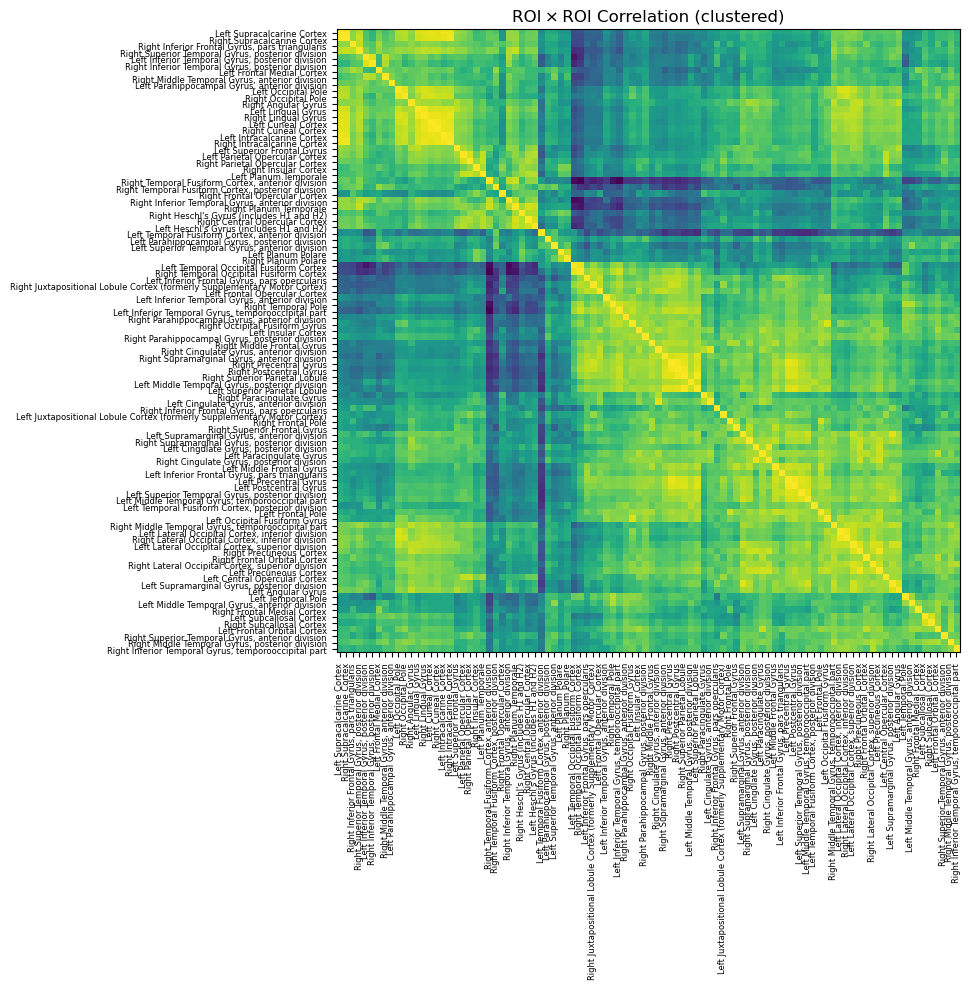

In [94]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, leaves_list
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 1) Extract each ROI’s mean time series
ts_dict = {}
for idx, mask in enumerate(roi_masks):
    # atlas.labels is offset by 1 because labels[0] is background
    roi_name = atlas.labels[idx+1]
    roi_ts = smoothed.extract_roi(mask)        # shape (n_tr,)
    ts_dict[roi_name] = roi_ts

# 2) Build a DataFrame (n_tr × n_rois)
ts_df = pd.DataFrame(ts_dict)

# 3) (Optional) z-score each column across time
ts_df = pd.DataFrame(StandardScaler().fit_transform(ts_df),
                     columns=ts_df.columns)

# 4) Compute correlation matrix (n_rois × n_rois)
corr = ts_df.corr()

# 5) Hierarchical clustering to get an ordering of ROIs
Z = linkage(corr, method='ward')              # perform linkage on correlation matrix
order = leaves_list(Z)                        # get dendrogram leaf order

# 6) Reorder the matrix
corr_ord = corr.iloc[order, order]

# 7) Plot the clustered correlation heatmap
plt.figure(figsize=(10,10))
plt.imshow(corr_ord.values, aspect='equal')
plt.xticks(range(len(order)), corr_ord.index, rotation=90, fontsize=6)
plt.yticks(range(len(order)), corr_ord.index, fontsize=6)
plt.title('ROI × ROI Correlation (clustered)')
plt.tight_layout()
plt.show()

In [95]:
from sklearn.cluster import AgglomerativeClustering

# 1) Build distance matrix
dist = 1 - corr

# 2) Choose number of clusters
K = 4

model = AgglomerativeClustering(
    n_clusters=K,
    linkage='average'     # you can also try 'complete' or 'single'
)
labels = model.fit_predict(dist)

# 3) Group ROIs by label
clusters = {}
for roi, lbl in zip(corr.columns, labels):
    clusters.setdefault(lbl, []).append(roi)

for lbl, rois in clusters.items():
    print(f"Cluster {lbl}: {rois}")


Cluster 0: ['Left Frontal Pole', 'Right Frontal Pole', 'Left Insular Cortex', 'Right Insular Cortex', 'Left Superior Frontal Gyrus', 'Right Superior Frontal Gyrus', 'Left Middle Frontal Gyrus', 'Right Middle Frontal Gyrus', 'Left Inferior Frontal Gyrus, pars triangularis', 'Right Inferior Frontal Gyrus, pars triangularis', 'Left Inferior Frontal Gyrus, pars opercularis', 'Right Inferior Frontal Gyrus, pars opercularis', 'Left Precentral Gyrus', 'Right Precentral Gyrus', 'Left Temporal Pole', 'Right Temporal Pole', 'Right Superior Temporal Gyrus, anterior division', 'Left Superior Temporal Gyrus, posterior division', 'Right Superior Temporal Gyrus, posterior division', 'Left Middle Temporal Gyrus, anterior division', 'Right Middle Temporal Gyrus, anterior division', 'Left Middle Temporal Gyrus, posterior division', 'Right Middle Temporal Gyrus, posterior division', 'Left Middle Temporal Gyrus, temporooccipital part', 'Right Middle Temporal Gyrus, temporooccipital part', 'Left Inferior T

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:584: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out = hierarchy.linkage(X, method=linkage, metric=affinity)


/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/masking.py:979: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(mask_img, unmasked, affine)
/tmp/ipykernel_767300/2388842217.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


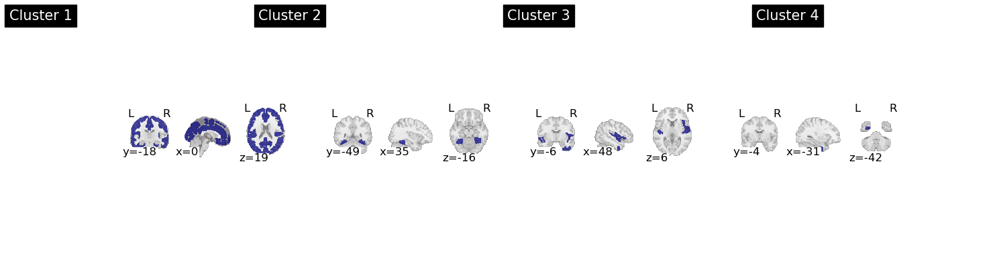

In [97]:
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import plotting

# 1) Convert all your Brain_Data masks to nibabel.Nifti1Image
nifti_masks = [bd.to_nifti() for bd in roi_masks]

# 2) Build a name→nifti lookup
mask_dict = {
    atlas.labels[i+1]: nifti_masks[i]
    for i in range(len(nifti_masks))
}

# — set up your subplot grid —
fig, axes = plt.subplots(
    nrows=1, ncols=K,
    figsize=(15, 4),
    subplot_kw={'xticks': [], 'yticks': []}
)

    # merge their masks into one volume
for ax, cl_id in zip(axes.flatten(), range(K)):
    # gather the ROI names in this cluster
    rois_in_cl = [
        roi for roi, lbl in zip(corr.columns, labels) 
        if lbl == cl_id
    ]

    combined = None
    for roi in rois_in_cl:
        nii = mask_dict[roi]                   # a Nifti1Image
        data = (nii.get_fdata() > 0).astype(int)
        if combined is None:
            combined = data.copy()
            affine = nii.affine
        else:
            combined |= data

    # make a new merged image
    merged_img = nib.Nifti1Image(combined.astype(np.int32), affine)

    plotting.plot_roi(
        merged_img,
        axes=ax,
        title=f'Cluster {cl_id+1}',
        display_mode='ortho',
        draw_cross=False,
        annotate=True
    )

plt.tight_layout()
plt.show()


/tmp/ipykernel_767300/2246614102.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


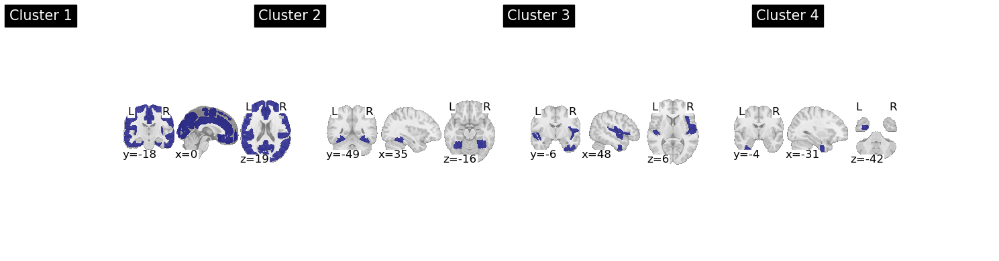

In [99]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import datasets, plotting
from nilearn.plotting import find_xyz_cut_coords

# load a full‐brain MNI template
template = datasets.load_mni152_template()

fig, axes = plt.subplots(1, K, figsize=(15, 4),
                         subplot_kw={'xticks': [], 'yticks': []})

for ax, cl_id in zip(axes, range(K)):
    # ------- same merging code as before -------
    rois_in_cl = [roi for roi, lbl in zip(corr.columns, labels)
                  if lbl == cl_id]

    combined = None
    for roi in rois_in_cl:
        nii   = mask_dict[roi]
        data  = (nii.get_fdata() > 0).astype(int)
        if combined is None:
            combined = data.copy()
            affine  = nii.affine
        else:
            combined |= data

    merged_img = nib.Nifti1Image(combined.astype(np.int32), affine)
    # --------------------------------------------

    # compute the cluster’s center‐of‐mass
    com = find_xyz_cut_coords(merged_img)

    plotting.plot_roi(
        merged_img,
        bg_img=template,     # overlay on full brain so it’s always centred
        axes=ax,
        display_mode='ortho',
        cut_coords=com,      # centre on this cluster
        draw_cross=False,
        annotate=True,
        title=f'Cluster {cl_id+1}',
        black_bg=False       # white background if you prefer
    )

plt.tight_layout()
plt.show()


/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/numpy/ma/core.py:2826: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/tmp/ipykernel_767300/2829729459.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


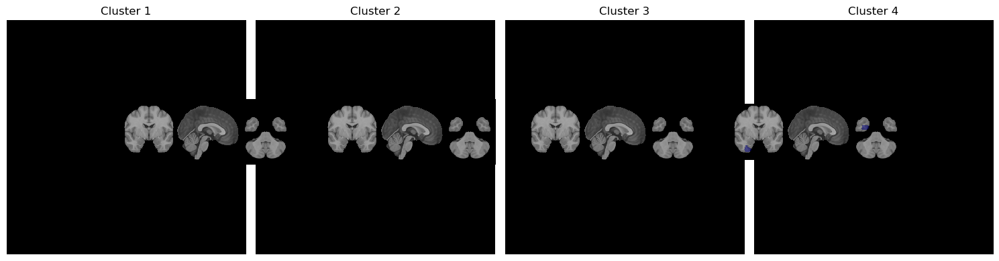

In [100]:
import matplotlib.pyplot as plt
import numpy as np
from nilearn import plotting, datasets

# 1) Load your MNI template
template = datasets.load_mni152_template()

# 2) Prepare a fixed slice you like (or compute each cluster’s COM as before)
cut_coords = (0, -4, -42)

# 3) Make one subplot per cluster
fig, axes = plt.subplots(1, K, figsize=(15, 4),
                         subplot_kw={'xticks': [], 'yticks': []})

for ax, cl_id in zip(axes, range(K)):
    # find all ROIs belonging to this cluster
    rois_in_cluster = [roi for roi, lbl in zip(corr.columns, labels)
                       if lbl == cl_id]
    # overlay each ROI mask
    for roi in rois_in_cluster:
        plotting.plot_roi(
            mask_dict[roi],       # your Nifti mask for that ROI
            bg_img=template,      # keep brain centered
            axes=ax,
            display_mode='ortho',
            cut_coords=cut_coords,
            draw_cross=False,
            annotate=False,       # only title, no extra labels
            alpha=0.5             # semi‐transparent so overlaps show
        )
    ax.set_title(f'Cluster {cl_id+1}')

plt.tight_layout()
plt.show()


Next steps:
* get certain rois and get the other rois with the highest correlation
* plot the time seires 

if possible: 
* svm

# Seed based analysis - Dorsal and Ventral pathways
The ventral pathway primarily handles visual word recognition and semantic processing, while the dorsal pathway specializes in grapheme-to-phoneme conversion and phonological processing, including the resolution of phonological output. 

**Ventral Pathway (Lexicosemantic Route)**
* Left Occipitotemporal Region / Fusiform Gyrus (Visual Word Form Area—VWFA) *(77, 79)*
* Left Inferior Temporal Gyrus *(27, 29, 31)*
* basal inferior temporal area *(27-32)* / posterior part of the middle temporal gyrus *(23-26)* / triangular part of the inferior frontal gyrus *(9-12)*
    * The "Words > Pseudowords" contrast consistently activates these semantic regions

**Dorsal Pathway (Graphophonological Route)**
* Left Superior Temporal Areas/Gyrus *(17, 19)*
* Left Supramarginal Gyrus *(37, 39)*
* Left Inferior Frontal Gyrus *(9, 11)*
* Precentral Gyrus and Supplementary Motor Area *(13, 14, 51, 52)*

*↪odd numbers are on the left hemisphere*

In [75]:
# for the ventral pathway, use Left Inferior Temporal Gyrus (27) as seed

def make_motion_covariates(mc, tr):
    z_mc = zscore(mc)
    all_mc = pd.concat([z_mc, z_mc**2, z_mc.diff(), z_mc.diff()**2], axis=1)
    all_mc.fillna(value=0, inplace=True)
    return Design_Matrix(all_mc, sampling_freq=1/tr)

LITG = smoothed.extract_roi(mask=roi_masks[27-1])
LITG = zscore(pd.DataFrame(LITG, columns=['LITG']))

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/masking.py:979: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(mask_img, unmasked, affine)


In [77]:
LITG.shape

(174, 1)

In [79]:
# necessary ?
csf_mask = Brain_Data('/home/yvonne/ds003481-1.0.2/output/sub-123/anat/sub-123_label-CSF_probseg.nii.gz')
csf_mask = csf_mask.threshold(upper=0.7, binarize=True)
csf = zscore(pd.DataFrame(smoothed.extract_roi(mask=csf_mask).T, columns=['csf']))

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nilearn/maskers/nifti_masker.py:114: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(


[NiftiMasker.wrapped] Resampling images


In [56]:
smoothed.X

,mental_c0,pseudo_c0,motor_c0,symbol_c0,cosine_1,cosine_2,cosine_3,cosine_4,poly_0,trans_x,...,global_spike1,global_spike2,global_spike3,global_spike4,global_spike5,diff_spike1,diff_spike2,diff_spike3,diff_spike4,diff_spike5
0,0.0,0.0,0.000000,0.0,1.000000,0.999878,0.999674,0.999389,1.0,-1.409788,...,0,0,0,0,0,0,0,0,0,0
1,0.0,0.0,0.000000,0.0,0.999674,0.998574,0.996742,0.994178,1.0,-1.727821,...,0,0,0,0,0,0,0,0,0,0
2,0.0,0.0,0.000000,0.0,0.999022,0.995969,0.990886,0.983785,1.0,-1.766278,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.000000,0.0,0.998045,0.992064,0.982124,0.968262,1.0,-1.393441,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.000000,0.0,0.996742,0.986867,0.970481,0.947692,1.0,-1.704715,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,0.0,0.0,0.778145,0.0,-0.996742,0.986867,-0.970481,0.947692,1.0,1.216293,...,0,0,0,0,0,0,0,0,0,0
170,0.0,0.0,0.552670,0.0,-0.998045,0.992064,-0.982124,0.968262,1.0,1.119996,...,0,0,0,0,0,0,0,0,0,0
171,0.0,0.0,0.116666,0.0,-0.999022,0.995969,-0.990886,0.983785,1.0,1.131371,...,0,0,0,0,0,0,0,0,0,0
172,0.0,0.0,-0.159153,0.0,-0.999674,0.998574,-0.996742,0.994178,1.0,1.066332,...,0,0,0,0,0,0,0,0,0,0


In [118]:
csf.shape

(174, 1)

In [107]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# — assume ts_df is your z-scored DataFrame of shape (n_tr × n_rois),
#   with columns=atlas.labels[1:] in the same order as roi_masks

# 1) Identify your seed
seed_idx = 27                # zero-based into atlas.labels[1:]
seed_name = atlas.labels[seed_idx]
seed_ts = ts_df[seed_name]

# 2) Compute correlation + p-value vs. every other ROI
results = []
for roi in ts_df.columns:
    if roi == seed_name:
        continue
    r, p = pearsonr(seed_ts, ts_df[roi])
    results.append((roi, r, p))

# 3) Build a DataFrame and sort by descending r
conn_df = pd.DataFrame(results, columns=['ROI', 'r', 'p'])
conn_df = conn_df.sort_values('r', ascending=False).reset_index(drop=True)

# 4) (Optional) apply a significance threshold
alpha = 0.05 / (len(conn_df))   # Bonferroni correction
sig_df = conn_df[conn_df['p'] < alpha]
top10 = conn_df.head(10)

print("Top 10 ROIs by connectivity with LITG:")
print(top10)

print("\nSignificant at p < {:.2e} (Bonferroni):".format(alpha))
print(sig_df)


Top 10 ROIs by connectivity with LITG:
                                                 ROI         r             p
0                                Right Temporal Pole  0.790564  1.785145e-38
1                      Left Occipital Fusiform Gyrus  0.724771  1.240710e-29
2                     Right Occipital Fusiform Gyrus  0.715224  1.464283e-28
3                     Right Superior Parietal Lobule  0.708508  7.829419e-28
4                            Right Postcentral Gyrus  0.698753  8.227102e-27
5                                  Left Frontal Pole  0.696228  1.489229e-26
6  Left Inferior Temporal Gyrus, temporooccipital...  0.694796  2.079111e-26
7                             Right Precentral Gyrus  0.694657  2.147659e-26
8                      Left Superior Parietal Lobule  0.693100  3.079673e-26
9                             Left Postcentral Gyrus  0.668230  7.270115e-24

Significant at p < 5.26e-04 (Bonferroni):
                                                  ROI         r        

/tmp/ipykernel_762324/3521324668.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 1200x400 with 0 Axes>

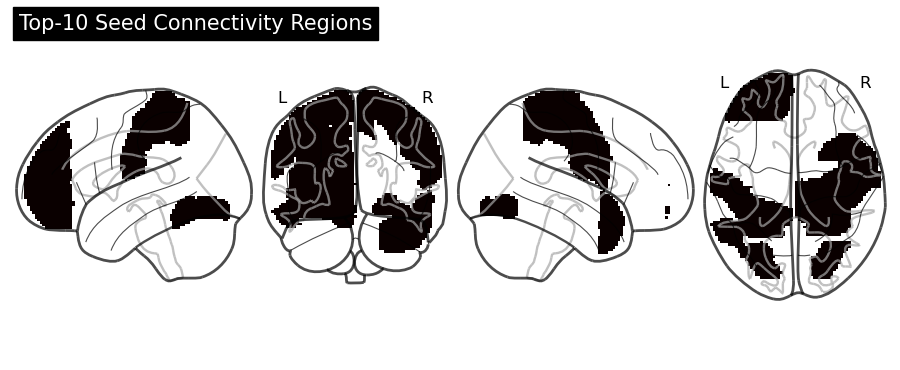

In [108]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn.plotting import plot_glass_brain

# — assume you already have —
# top10: a DataFrame with your top-10 ROIs in top10['ROI']
# mask_dict: ROI name → nibabel.Nifti1Image mask (binary)
# (as built in the snippets above)

# 1) Merge the top-10 masks into one binary volume
first_img = mask_dict[top10['ROI'].iloc[0]]
shape, affine = first_img.shape, first_img.affine

merged_data = np.zeros(shape, dtype=np.uint8)
for roi_name in top10['ROI']:
    img = mask_dict[roi_name]
    merged_data |= (img.get_fdata() > 0).astype(np.uint8)

merged_img = nib.Nifti1Image(merged_data, affine)

# 2) Plot on a glass brain with four views in one figure
plt.figure(figsize=(12, 4))
plot_glass_brain(
    merged_img,
    display_mode='lyrz',      # 'l'eft, co'r'onal, 'r'ight, a'x'ial
    colorbar=False,
    plot_abs=False,
    alpha=0.7,
    title='Top-10 Seed Connectivity Regions'
)
plt.tight_layout()
plt.show()


/tmp/ipykernel_762324/1023881397.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


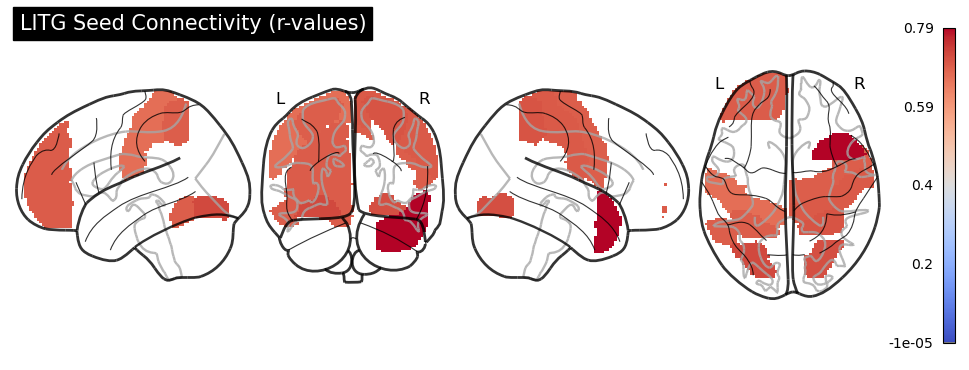

In [109]:
# Build a floating‐point map of the same shape
weight_map = np.zeros(merged_data.shape, dtype=np.float32)

for roi_name in top10['ROI']:
    r_val = conn_df.loc[conn_df['ROI'] == roi_name, 'r'].item()
    mask = (mask_dict[roi_name].get_fdata() > 0)
    weight_map[mask] = r_val

weighted_img = nib.Nifti1Image(weight_map, affine)

plot_glass_brain(
    weighted_img,
    display_mode='lyrz',
    colorbar=True,
    cmap='coolwarm',          # or any sequential map you like
    vmin=0, vmax=weight_map.max(),
    alpha=0.8,
    title='LITG Seed Connectivity (r-values)'
)
plt.tight_layout()
plt.show()

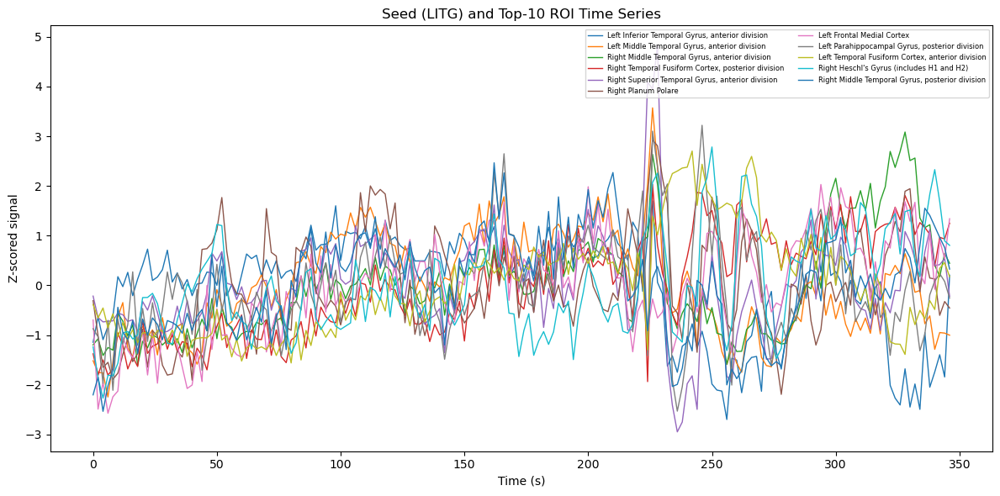

In [114]:
# 1) Assemble your ROI list
seed_idx  = 27
seed_name = atlas.labels[seed_idx]
top_rois  = conn_df['ROI'].head(10).tolist()
rois      = [seed_name] + top_rois

# 2) (Optional) create a time‐axis in seconds if you know TR
TR = 2.0  # seconds per volume
times = np.arange(len(ts_df)) * TR

# 3) Plot
plt.figure(figsize=(12, 6))
for roi in rois:
    plt.plot(times, ts_df[roi], label=roi, linewidth=1)

plt.xlabel('Time (s)')
plt.ylabel('Z-scored signal')
plt.title('Seed (LITG) and Top-10 ROI Time Series')
plt.legend(loc='upper right', ncol=2, fontsize=6)
plt.tight_layout()
plt.show()


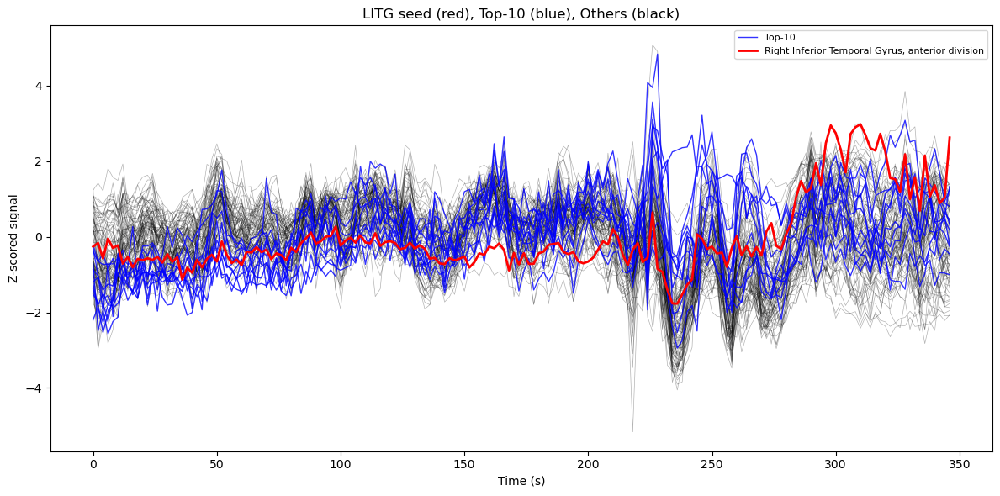

In [115]:
import numpy as np
import matplotlib.pyplot as plt

# 1) Define your sets
seed_idx  = 27
seed_name = atlas.labels[seed_idx+1]
top_rois  = conn_df['ROI'].head(10).tolist()
all_rois  = ts_df.columns.tolist()

# 2) Build a time‐axis (optional)
TR    = 2.0
times = np.arange(len(ts_df)) * TR

# 3) Plot
plt.figure(figsize=(12, 6))

# 3a) everything else in black
for roi in all_rois:
    if roi not in ([seed_name] + top_rois):
        plt.plot(times, ts_df[roi], color='black', alpha=0.3, linewidth=0.5)

# 3b) top-10 in blue
for i, roi in enumerate(top_rois):
    plt.plot(times, ts_df[roi], color='blue', alpha=0.8, linewidth=1,
             label='Top-10' if i==0 else None)

# 3c) seed in red
plt.plot(times, ts_df[seed_name], color='red', linewidth=2, label=seed_name)

# 4) Final touches
plt.xlabel('Time (s)')
plt.ylabel('Z-scored signal')
plt.title('LITG seed (red), Top-10 (blue), Others (black)')
plt.legend(loc='upper right', fontsize=8)
plt.tight_layout()
plt.show()


In [126]:
run01[run01.onset > 200]

,onset,duration,trial_type
47,201,1,symbol
48,204,1,symbol
49,207,1,symbol
50,222,1,mental
51,225,1,mental
52,228,1,mental
53,231,1,mental
54,234,1,mental
55,237,1,mental
56,240,1,mental


In [119]:
# — assume ts_df is your z-scored DataFrame of shape (n_tr × n_rois),
#   with columns=atlas.labels[1:] in the same order as roi_masks

# 1) Identify your seed
seed_idx = 17                # zero-based into atlas.labels[1:]
seed_name = atlas.labels[seed_idx]
seed_ts = ts_df[seed_name]

# 2) Compute correlation + p-value vs. every other ROI
results = []
for roi in ts_df.columns:
    if roi == seed_name:
        continue
    r, p = pearsonr(seed_ts, ts_df[roi])
    results.append((roi, r, p))

# 3) Build a DataFrame and sort by descending r
conn_df = pd.DataFrame(results, columns=['ROI', 'r', 'p'])
conn_df = conn_df.sort_values('r', ascending=False).reset_index(drop=True)

# 4) (Optional) apply a significance threshold
alpha = 0.05 / (len(conn_df))   # Bonferroni correction
sig_df = conn_df[conn_df['p'] < alpha]
top10 = conn_df.head(10)

print("Top 10 ROIs by connectivity with LSTG:")
print(conn_df.head(10))

print("\nSignificant at p < {:.2e} (Bonferroni):".format(alpha))
print(sig_df)


Top 10 ROIs by connectivity with LSTG:
                                                 ROI         r             p
0      Left Middle Temporal Gyrus, anterior division  0.680023  5.827038e-25
1     Right Middle Temporal Gyrus, anterior division  0.615752  1.538070e-19
2  Right Temporal Fusiform Cortex, posterior divi...  0.599169  2.461541e-18
3   Right Superior Temporal Gyrus, anterior division  0.598260  2.852746e-18
4                                Right Planum Polare  0.560051  9.387843e-16
5                         Left Frontal Medial Cortex  0.541683  1.179852e-14
6     Left Parahippocampal Gyrus, posterior division  0.524048  1.164521e-13
7   Left Temporal Fusiform Cortex, anterior division  0.506017  1.059325e-12
8          Right Heschl's Gyrus (includes H1 and H2)  0.486377  1.017156e-11
9    Right Middle Temporal Gyrus, posterior division  0.480376  1.973567e-11

Significant at p < 5.26e-04 (Bonferroni):
                                                  ROI         r        

/tmp/ipykernel_762324/309799607.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


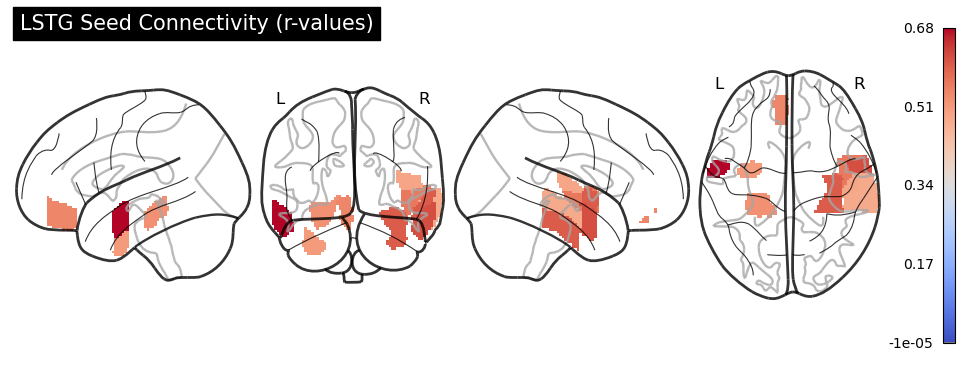

In [120]:
# Build a floating‐point map of the same shape
weight_map = np.zeros(merged_data.shape, dtype=np.float32)

for roi_name in top10['ROI']:
    r_val = conn_df.loc[conn_df['ROI'] == roi_name, 'r'].item()
    mask = (mask_dict[roi_name].get_fdata() > 0)
    weight_map[mask] = r_val

weighted_img = nib.Nifti1Image(weight_map, affine)

plot_glass_brain(
    weighted_img,
    display_mode='lyrz',
    colorbar=True,
    cmap='coolwarm',          # or any sequential map you like
    vmin=0, vmax=weight_map.max(),
    alpha=0.8,
    title='LSTG Seed Connectivity (r-values)'
)
plt.tight_layout()
plt.show()

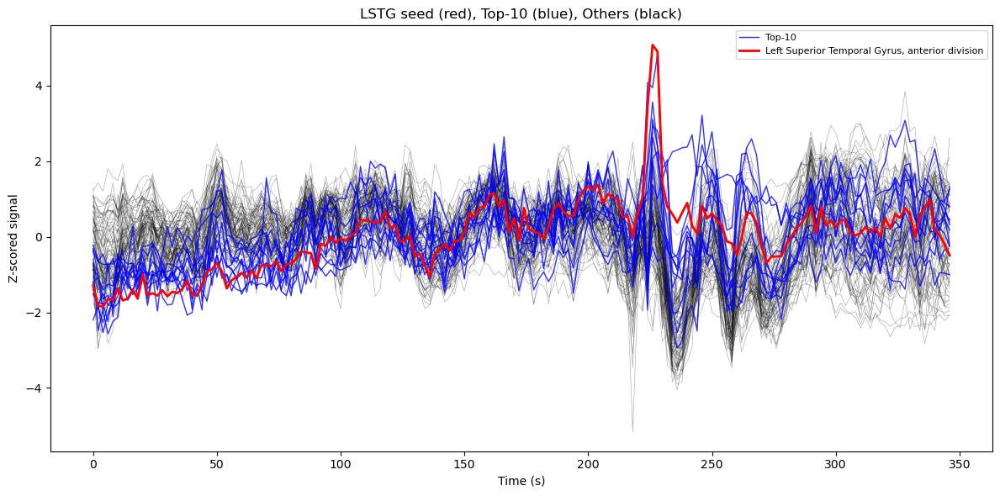

In [121]:
import numpy as np
import matplotlib.pyplot as plt

# 1) Define your sets
seed_idx  = 17
seed_name = atlas.labels[seed_idx]
top_rois  = conn_df['ROI'].head(10).tolist()
all_rois  = ts_df.columns.tolist()

# 2) Build a time‐axis (optional)
TR    = 2.0
times = np.arange(len(ts_df)) * TR

# 3) Plot
plt.figure(figsize=(12, 6))

# 3a) everything else in black
for roi in all_rois:
    if roi not in ([seed_name] + top_rois):
        plt.plot(times, ts_df[roi], color='black', alpha=0.3, linewidth=0.5)

# 3b) top-10 in blue
for i, roi in enumerate(top_rois):
    plt.plot(times, ts_df[roi], color='blue', alpha=0.8, linewidth=1,
             label='Top-10' if i==0 else None)

# 3c) seed in red
plt.plot(times, ts_df[seed_name], color='red', linewidth=2, label=seed_name)

# 4) Final touches
plt.xlabel('Time (s)')
plt.ylabel('Z-scored signal')
plt.title('LSTG seed (red), Top-10 (blue), Others (black)')
plt.legend(loc='upper right', fontsize=8)
plt.tight_layout()
plt.show()


Next steps: 
* separate conditions?

# SVM - *No Time* ⏱️

---

## Other attempts that failed...
⚠️⚠️⚠️⚠️ **Something wrong with the design matrix**

In [ ]:
spikes = smoothed.find_spikes(global_spike_cutoff=3, diff_spike_cutoff=3)
covariates = pd.read_csv('ds003481-1.0.2/output/sub-123/func/sub-123_task-verbs_run-01_desc-confounds_timeseries.tsv', sep='\t')
mc = covariates[['trans_x','trans_y','trans_z','rot_x', 'rot_y', 'rot_z']]
mc_cov = make_motion_covariates(mc, tr)

dm_csf = Design_Matrix(pd.concat([pd.DataFrame(LITG), 
                                  pd.DataFrame(csf), 
                                  pd.DataFrame(mc_cov), 
                                  pd.DataFrame(spikes)], axis=1), sampling_freq=1/tr)
dm_csf = dm_csf.add_poly(order=2, include_lower=True)

/home/yvonne/miniconda3/envs/brainhack/lib/python3.10/site-packages/nltools/stats.py:1761: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  outlier["global_spike" + str(i + 1)].iloc[int(loc)] = 1
/home/yvonne/miniconda3/envs/brainhack/lib/pytho

In [ ]:
smoothed.X = dm_csf
stats = smoothed.regress()

LITG_conn = stats['beta'][0]

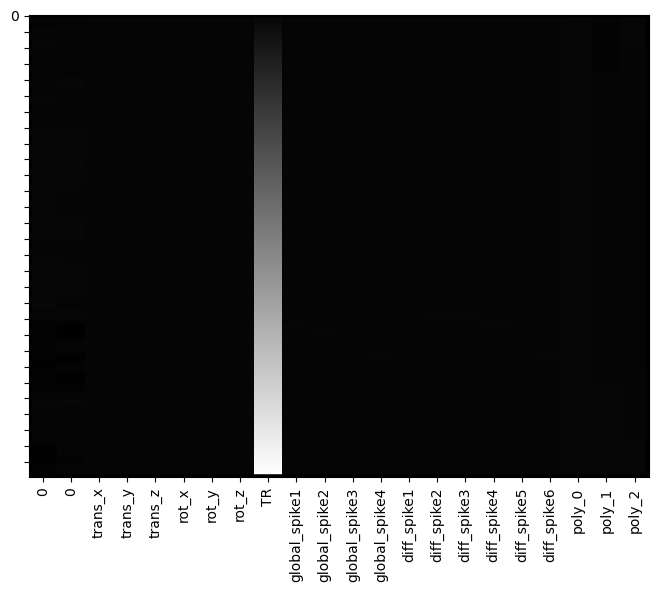

In [138]:
dm_csf.heatmap()

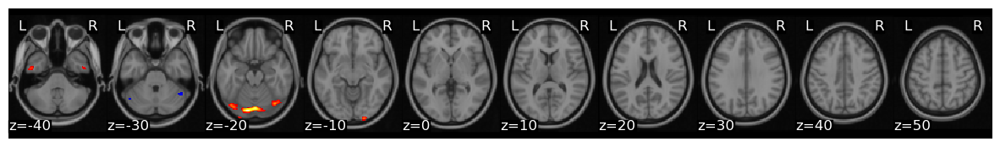

In [131]:
LITG_conn.threshold(upper=25, lower=-25).plot()

explore another region...

In [ ]:
# for the dorsal pathway, use Left Superior Temporal Gyrus (17) as seed

def make_motion_covariates(mc, tr):
    z_mc = zscore(mc)
    all_mc = pd.concat([z_mc, z_mc**2, z_mc.diff(), z_mc.diff()**2], axis=1)
    all_mc.fillna(value=0, inplace=True)
    return Design_Matrix(all_mc, sampling_freq=1/tr)

LITG = smoothed.extract_roi(mask=roi_masks[27-1])
LITG = zscore(pd.DataFrame(LITG, columns=['LITG']))